In [1]:
import warnings
warnings.filterwarnings("ignore")
from utils.io_utils import *
from utils.opensim_kinematics_utils import *
from utils.data_processing_utils import *
from utils.analysis_utils import *

In [2]:
# define variables

SUBJECT = "Mathieu"
N_CYCLES = 10
N_COMBOS = 15

# landmarks for which only 1 correct marker was placed on the body
MARKERS_WITHOUT_DISPLACEMENT = [
    "LLTHI", "LLSHA", "LHEE", "LMT2", "LMT5",
    "RLTHI", "RLSHA", "RHEE", "RMT2", "RMT5",
    "C7", "T10", "XIPH", "JN"]

# landmarks for which both correct and 4 displaced markers were placed on the body
MARKERS_WITH_DISPLACEMENT = ["RASIS", "LASIS", "RPSIS", "LPSIS",
                             "LLEK", "LMEK", "RLEK", "RMEK",
                             "LLM", "LMM", "RLM", "RMM"]

ALL_MARKERS = MARKERS_WITH_DISPLACEMENT + MARKERS_WITHOUT_DISPLACEMENT

MARKERSET_FILE = "example_markerset_files/HMB2_MODEL_markers.xml"

# in this notebook the combinations of displacement are deterined randomly
COMBOS = generate_random_marker_combinations(MARKERS_WITH_DISPLACEMENT, N_COMBOS)

KINEMATICS = ["pelvis_tilt", "pelvis_list", "pelvis_rotation", "hip_flexion_r", "hip_adduction_r", "hip_rotation_r", "knee_angle_r", "ankle_angle_r",
 "subtalar_angle_r", "hip_flexion_l", "hip_adduction_l", "hip_rotation_l", "knee_angle_l", "ankle_angle_l",
 "subtalar_angle_l"]

C3D_CALIB_FILE = os.path.join("example_c3d_files", f"Calibration_{SUBJECT}.c3d")
C3D_WALK_FILE = os.path.join("example_c3d_files", f"Walk_{SUBJECT}.c3d")
GAIT_EVENT_FILE = f"gait_events_{SUBJECT}.csv" # gait event file corresponding to walk c3d file

RESULTS_FOLDER = f"test_opensim_displacements_{SUBJECT}"

TEMPLATE_SCALING_SETUP_FILE = "template_scaling_setup.xml"

In [3]:
os.makedirs(RESULTS_FOLDER, exist_ok=True)  

# Part 1: Groundtruth
2 important files resulting from this code and used for evaluation of pipeline:
- pointkin_pointkin_groundtruth_walking_dynamic.trc : GT marker coordinates during walking trial, after point kinematics step (mandatory for comparison with corrected files that rely on point kinematics (see details explanation in STEP 3))
- pointkin_pointkin_groundtruth_walking_dynamic_motion.mot : GT joint angles during walking trial, after point kinematics step

--> for this pipeline, the pointkinematics step needs to be repeated 2 times, in order to have comparable conditions between ground truth and displaced/corrected.

In [4]:
# STEP 1: SCALE GT MODEL WITH .c3d CALIB FILE, BASED ONLY ON COORDINATES OF GT MARKERS
scaling("groundtruth",
        RESULTS_FOLDER,
        ALL_MARKERS,
        TEMPLATE_SCALING_SETUP_FILE,
        MARKERSET_FILE,
        c3d_calib_file=C3D_CALIB_FILE)

path_to_gt_scaled_model = os.path.join(RESULTS_FOLDER, "groundtruth" + "_scaled_model_markers.osim")

# STEP 2: INVERSE KINEMATICS ON WALKING AND CALIB .trc TO BE ABLE TO DO POINT KINEMATICS ON GT CALIB AND GT WALKING
# this step is necessary to be able to compare the results of GT with the displaced and corrected results
# indeed, they are based on point kinematics on the calib and walking file
# (this is the case because we simulate the displacements in opensim, and we don't have real data from c3d files)
# --> this will give a .mot calib and a .mot walking file that will be used in next step to do point kinematics

inverse_kinematics("groundtruth_calib",
                   "static",
                   ALL_MARKERS,
                   MARKERSET_FILE,
                   path_to_gt_scaled_model,
                   RESULTS_FOLDER,
                   c3d_dynamic_file=C3D_CALIB_FILE,
                   dyn_initial_time = 0,
                   dyn_final_time = 1)
path_to_gt_calib_motion = os.path.join(RESULTS_FOLDER, "groundtruth_calib_static_motion.mot")
inverse_kinematics("groundtruth_walking",
                   "dynamic",
                   ALL_MARKERS,
                   MARKERSET_FILE,
                   path_to_gt_scaled_model,
                   RESULTS_FOLDER,
                   c3d_dynamic_file=C3D_WALK_FILE,
                   gait_event_file= GAIT_EVENT_FILE,
                   n_cycles=N_CYCLES)
path_to_gt_walking_motion = os.path.join(RESULTS_FOLDER, "groundtruth_walking_dynamic_motion.mot")

# STEP 3: POINT KINEMATICS ON CALIB AND WALKING .mot to GET .trc FILES
# THAT WILL BE USED TO RESCALE A MODEL AND GET THE MARKER COORDINATES AND JOINT ANGLES
# --> this will give a .trc calib file and a .trc walking file
point_kinematics ("pointkin_groundtruth_calib",
                  "static",
                  MARKERSET_FILE,
                  RESULTS_FOLDER,
                  path_to_gt_scaled_model,
                  path_to_gt_calib_motion,
                  start_time = 0,
                  end_time = 1)
path_to_gt_pointkin_calib_trc = os.path.join(RESULTS_FOLDER, f"pointkin_groundtruth_calib_static.trc")

point_kinematics ("pointkin_groundtruth_walking",
                  "dynamic",
                  MARKERSET_FILE,
                  RESULTS_FOLDER,
                  path_to_gt_scaled_model,
                  path_to_gt_walking_motion,
                  gait_event_file= GAIT_EVENT_FILE,
                  n_cycles=N_CYCLES)
path_to_gt_pointkin_walking_trc = os.path.join(RESULTS_FOLDER, f"pointkin_groundtruth_walking_dynamic.trc")

# --> AT THIS POINT WE HAVE 1 .TRC CALIB FILE AND 1 .TRC WALKING FILE OBTAINED FROM POINT KINEMATICS,
# WHICH NOW ALLOWS TO PERFORM THE STEPS IN THE SAME CONDITION FOR GT AND DISPLACED FILES
# (THE CONDITION IS THAT THE COORDINATES OF THE MARKERS ARE FROM POINT KINEAMTICS AND NOT DIRECTLY FROM C3D FILE)

# STEP 4: SCALE THE ACTUAL GT MODEL FROM POINTKIN .trc CALIB FILE
# --> this gives the GT model that is actually going to be used
scaling ("pointkin_groundtruth",
        RESULTS_FOLDER,
        ALL_MARKERS,
        TEMPLATE_SCALING_SETUP_FILE,
        MARKERSET_FILE,
        trc_calib_file=path_to_gt_pointkin_calib_trc)
path_to_pointkin_gt_scaled_model = os.path.join(RESULTS_FOLDER, "pointkin_groundtruth" + "_scaled_model_markers.osim")

# STEP 5: INVERSE KINEMATICS WITH GT MODEL ON POINTKIN WALKING .trc FILE OBTAINED IN PREVIOUS STEP
# --> this gives 1 .mot file that will be used to do point kinematics of GT markers (see explanation later)
inverse_kinematics("pointkin_groundtruth_walking",
                   "dynamic",
                   ALL_MARKERS,
                   MARKERSET_FILE,
                   path_to_pointkin_gt_scaled_model,
                   RESULTS_FOLDER,
                   trc_dynamic_file=path_to_gt_pointkin_walking_trc,
                   gait_event_file=GAIT_EVENT_FILE,
                   n_cycles=N_CYCLES)
path_to_pointkin_gt_walking_motion = os.path.join(RESULTS_FOLDER, "pointkin_groundtruth_walking_dynamic_motion.mot")

# STEP 6: POINTKINEMATICS OF GT MARKERS ON .mot FILE OBTAINED FROM PREVIOUS STEP
# --> this gives 1 .trc file containing the pointkin coordinates of GT markers during GT motion
# that will be compared with the pointkin coordinates of the displaced and corrected markers before and after correction
point_kinematics ("pointkin_pointkin_groundtruth_walking",
                  "dynamic",
                  MARKERSET_FILE,
                  RESULTS_FOLDER,
                  path_to_pointkin_gt_scaled_model,
                  path_to_pointkin_gt_walking_motion,
                  gait_event_file=GAIT_EVENT_FILE,
                  n_cycles=N_CYCLES)
path_to_gt_pointkin_pointkin_walking_trc = os.path.join(RESULTS_FOLDER, f"pointkin_pointkin_groundtruth_walking_dynamic.trc")

# STEP 7: INVERSE KINEMATICS USING THE .trc WALKING FILE OBTAINED FROM PREVIOUS POINTKIN STEP
# --> this gives 1 .mot file containing the groundtruth joint angles after going through the necessary pointkin step
# that will be compared with the joint angles of the displaced and corrected files before and after correction
inverse_kinematics("pointkin_pointkin_groundtruth_walking",
                   "dynamic",
                   ALL_MARKERS,
                   MARKERSET_FILE,
                   path_to_pointkin_gt_scaled_model,
                   RESULTS_FOLDER,
                   trc_dynamic_file=path_to_gt_pointkin_pointkin_walking_trc,
                   gait_event_file=GAIT_EVENT_FILE,
                   n_cycles=N_CYCLES)
path_to_gt_pointkin_pointkin_walking_motion = os.path.join(RESULTS_FOLDER, f"pointkin_pointkin_groundtruth_walking_dynamic_motion.mot")


700
0 100
✅ Conversion terminée : test_opensim_displacements_Mathieu\groundtruth_calib_static.trc
700
0 100
✅ Conversion terminée : test_opensim_displacements_Mathieu\groundtruth_calib_static.trc
8031
79 1136
✅ Conversion terminée : test_opensim_displacements_Mathieu\groundtruth_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\pointkin_groundtruth_calib_static.trc
TRC file saved: test_opensim_displacements_Mathieu\pointkin_groundtruth_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\pointkin_pointkin_groundtruth_walking_dynamic.trc


# Part 2: Generation of coordinates and joint angle files from displaced trials 
Recall: the displacements are completely simulated on opensim with pointkinematics and not based on real data from .c3d files. this is why pointkinematics needed to be applied to the gt data too (for comparison in equal conditions).


30 important files resulting from this code and used for evaluation of pipeline:
- 15 .trc files in  `displaced_pointkin_walk_trcs`: displaced marker coordinates during walking trial, after point kinematics step 
- 15 .mot files in  `displaced_pointkin_walk_motions` : displaced joint angles during walking trial, after point kinematics step

In [5]:
# STEP 0: DEFINE START AND STOP TIME OF WALKING TRIAL, DEPENDING ON THE NUMBER OF GAIT CYCLES
gait_events_df = extract_gait_cycles(GAIT_EVENT_FILE)
gait_events_df = gait_events_df[:N_CYCLES]
start_time = gait_events_df["Time"].iloc[0]
end_time = gait_events_df["Time"].iloc[-1]

# lists to store the displaced marker trace and joint angle files
# that will be used to compare with the GT and files after correction
displaced_pointkin_walk_trcs = []
displaced_pointkin_walk_motions = []

for i, combo in enumerate (COMBOS):
    # STEP 1: UPDATE THE .XML MARKERSET FILE WITH DIFFERENT NAMES AND COORDINATES FOR THE DISPLACED MARKERS
    # THESE FILES ARE NEEDED FOR THE FOLLOWING POINTKINEMATICS STEP,
    # THAT WILL ALLOW TO GET THE POSITION OF THE VIRTUAL DISPLACED MARKERS ON THE MODEL DURING CALIBRATION AND WALKING TRIALS
    # THIS ALLOWS TO "FAKE" DATA THAT WE WOULD HAVE GOTTEN FROM THE .c3d FILES
    # --> this will give 15 updated .xml files defining the markersets depending on the displacement combo
    MARKERS_i = MARKERS_WITHOUT_DISPLACEMENT + combo
    DISPLACED_MARKERSET_FILE = os.path.join(RESULTS_FOLDER, f"combo{i}_HMB2_MODEL_markers.xml")
    deplacer_markers(MARKERSET_FILE, DISPLACED_MARKERSET_FILE, convert_markers(combo))

    # STEP 2: POINTKINEMATICS ON CALIB AND WALING .trc FILES (BASED ON GT MARKERS)
    # TO RETRIEVE COORDINATES OF VIRTUALLY SIMULATED DISPLACED MARKERS
    # THE .mot FILES USED ARE THE ONES OBTAINED IN STEP 2 OF PART 1
    # this will give 15 displaced .trc calib and 15 displaced .trc walking files
    point_kinematics (f"combo{i}_calib",
                      "static",
                      DISPLACED_MARKERSET_FILE,
                      RESULTS_FOLDER,
                      path_to_gt_scaled_model,
                      path_to_gt_calib_motion,
                      0,
                      1)
    path_to_displaced_calib_trc = os.path.join(RESULTS_FOLDER, f"combo{i}_calib_static.trc")
    point_kinematics (f"combo{i}_walking",
                      "dynamic",
                      DISPLACED_MARKERSET_FILE,
                      RESULTS_FOLDER,
                      path_to_gt_scaled_model,
                      path_to_gt_walking_motion,
                      gait_event_file=GAIT_EVENT_FILE,
                      n_cycles=N_CYCLES)
    path_to_displaced_walking_trc = os.path.join(RESULTS_FOLDER, f"combo{i}_walking_dynamic.trc")


# FROM HERE THE PIPELINE IS EXACTLY THE SAME AS IN 01_test_carem_simulated_displacements.ipynb
# THE ONLY DIFFERENCE IN THIS NOTEBOOK IS THAT THE DISPLACED .TRC FILES NEED TO BE GENERATED (DONE IN THE PREVIOUS STEPS)

    # STEP 3: SCALING OF DISPLACED MODEL BASED ON POINTKIN DISPLACED .trc CALIB FILE OBTAINED FROM PREVIOUS STEP
    # --> this will result in 15 slightly different models
    scaling(f"combo{i}",
            RESULTS_FOLDER,
            MARKERS_i,
            TEMPLATE_SCALING_SETUP_FILE,
            MARKERSET_FILE, 
            trc_calib_file = path_to_displaced_calib_trc)
            
    path_to_displaced_scaled_model = os.path.join(RESULTS_FOLDER, f"combo{i}_scaled_model_markers.osim")

    # STEP 4: INVERSE KINEMATICS ON DISPLACED MODEL WITH COORDINATES FROM THE DISPLACED .trc WALKING FILE OBTAINED WITH POINTKIN
    # --> this will result in 15 slightly different .mot files that are going to be used for point kinematics in the next step
    # following the same logic as the ground truth for the comparison of results with corrected files
    # (point kin during correction induces a shift)
    inverse_kinematics(f"combo{i}_walking",
                        "dynamic",
                    MARKERS_i,
                    MARKERSET_FILE,
                    path_to_displaced_scaled_model,
                    RESULTS_FOLDER,
                    n_cycles=N_CYCLES,
                    gait_event_file = GAIT_EVENT_FILE,
                    trc_dynamic_file=path_to_displaced_walking_trc)
    
    path_to_displaced_walk_motion = os.path.join(RESULTS_FOLDER, f"combo{i}_walking_dynamic_motion.mot")

    # STEP 5: POINT KINEMATICS ON DISPLACED MODEL WITH GT MARKERSET ON .MOT FILE RESULTING FROM PREVIOUS INVERSE KINEMATICS STEP
    # --> this gives 15 .trc files that we will use to compare the marker coordinates with the ones in the GT and corrected .trc files
    point_kinematics (f"point_kin_combo{i}_walking",
                        "dynamic",
                        MARKERSET_FILE,
                        RESULTS_FOLDER,
                        path_to_displaced_scaled_model,
                        path_to_displaced_walk_motion,
                        gait_event_file=GAIT_EVENT_FILE,
                        n_cycles=N_CYCLES)
    
    path_to_displaced_pointkin_walk_trc = os.path.join(RESULTS_FOLDER, f"point_kin_combo{i}_walking_dynamic.trc")
    displaced_pointkin_walk_trcs.append(path_to_displaced_pointkin_walk_trc)

    # STEP 6: INVERSE KINEMATICS ON DISPLACED .trc WALK FILE OBTAINED FROM POINT KINEMATICS, BASED  ON COORDINATES OF DISPLACED MARKERS
    # --> this gives 15 .mot files that we will use compare the kinematics from the displaced models with the kinematics in the GT and obtained after correction
    inverse_kinematics(f"point_kin_combo{i}_walking",
                    "dynamic",
                    MARKERS_i,
                    MARKERSET_FILE,
                    path_to_displaced_scaled_model,
                    RESULTS_FOLDER,
                    trc_dynamic_file=path_to_displaced_pointkin_walk_trc,
                    dyn_initial_time = start_time,
                    dyn_final_time = end_time)
    path_to_displaced_pointkin_walk_motion = os.path.join(RESULTS_FOLDER, f"point_kin_combo{i}_walking_dynamic_motion.mot")
    displaced_pointkin_walk_motions.append(path_to_displaced_pointkin_walk_motion)

TRC file saved: test_opensim_displacements_Mathieu\combo0_calib_static.trc
TRC file saved: test_opensim_displacements_Mathieu\combo0_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_combo0_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\combo1_calib_static.trc
TRC file saved: test_opensim_displacements_Mathieu\combo1_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_combo1_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\combo2_calib_static.trc
TRC file saved: test_opensim_displacements_Mathieu\combo2_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_combo2_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\combo3_calib_static.trc
TRC file saved: test_opensim_displacements_Mathieu\combo3_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_combo3_walking_dynamic.trc
TRC file saved: test_opensim_displac

# Part 3: Correction of coordinates and joint angle files from displaced trials, using an averaged model

30 important files resulting from this code and used for evaluation of pipeline:
- 15 .trc files in  `averaged_pointkin_walk_trcs`: corrected marker coordinates during walking trial, after point kinematics step
- 15 .mot files in  `averaged_pointkin_walk_motions` : corrected joint angles during walking trial, after point kinematics step

## THIS PART IS IDENTICAL TO PART 3 IN `01_test_caren_simulated_displacememts.ipynb`

In [6]:
averaged_pointkin_walk_trcs = []
averaged_pointkin_walk_motions = []

# STEP 1: RETRIEVE ALL DISPLACED CALIB .trc FILES AND AVERAGE
# --> this results in 1 single averaged .trc calib file
prefixes = tuple(f"combo{i}_calib_static" for i in range(N_COMBOS))
path_to_averaged_calib_trc_file = os.path.join(RESULTS_FOLDER, "average_calib_static.trc")

load_average_and_save_trc_bis(
            folder_path=RESULTS_FOLDER,
            reference_trc_path=os.path.join(RESULTS_FOLDER, "groundtruth_calib_static.trc"),
            output_path=path_to_averaged_calib_trc_file,
            reference_marker_order=ALL_MARKERS,
            startswith=prefixes,
            opensim = True)

# STEP 2: SCALE AVERAGED MODEL BASED ON AVERAGED CALIB .trc FILE
scaling("average",
            RESULTS_FOLDER,
            ALL_MARKERS,
            TEMPLATE_SCALING_SETUP_FILE,
            MARKERSET_FILE,
            trc_calib_file = path_to_averaged_calib_trc_file)
path_to_averaged_scaled_model = os.path.join(RESULTS_FOLDER, "average_scaled_model_markers.osim")

for i in range (N_COMBOS):
    # STEP 3: INVERSE KINEAMTICS ON AVERAGED MODEL WITH MARKER COORDINATES FROM DISPLACED .trc FILES¨
    # --> this gives 15 .mot files of the average model moving according to the displaced coordinates
    inverse_kinematics(f"average_combo{i}_walking",
                   "dynamic",
                   ALL_MARKERS,
                   MARKERSET_FILE,
                   path_to_averaged_scaled_model,
                   RESULTS_FOLDER,
                   trc_dynamic_file=os.path.join(RESULTS_FOLDER, f"combo{i}_walking_dynamic.trc"),
                   dyn_initial_time = start_time,
                   dyn_final_time = end_time)
    path_to_averaged_walk_motion = os.path.join(RESULTS_FOLDER, f"average_combo{i}_walking_dynamic_motion.mot")

    # STEP 4: POINT KINEAMTICS ON MOTION FILE OBTAINED IN THE PREVIOUS INVKIN STEP
    # --> this gives the 15 corrected .trc files of the markers during the walking trial that are going to be compared with gt and displaced traces
    point_kinematics (f"point_kin_average_combo{i}_walking",
                      "dynamic",
                      MARKERSET_FILE,
                      RESULTS_FOLDER,
                      path_to_averaged_scaled_model,
                      path_to_averaged_walk_motion,
                      gait_event_file=GAIT_EVENT_FILE,
                      n_cycles=N_CYCLES)
    path_to_averaged_pointkin_walk_trc = os.path.join(RESULTS_FOLDER, f"point_kin_average_combo{i}_walking_dynamic.trc")
    averaged_pointkin_walk_trcs.append(path_to_averaged_pointkin_walk_trc)

    # STEP 5: INVERSE KINEAMTICS ON THE AVERAGED MODEL WITH MARKER COORDINATES FROM .trc FILE OBTAINED IN PREVIOUS POINTKIN STEP
    # --> this gives the 15 corrected .mot files of during the walking trial that are going to be compared with gt and displaced angles
    inverse_kinematics(f"point_kin_average_combo{i}_walking",
                    "dynamic",
                    ALL_MARKERS,
                    MARKERSET_FILE,
                    path_to_averaged_scaled_model,
                    RESULTS_FOLDER,
                    trc_dynamic_file=path_to_averaged_pointkin_walk_trc,
                    dyn_initial_time = start_time,
                    dyn_final_time = end_time)
    path_to_averaged_pointkin_walk_motion = os.path.join(RESULTS_FOLDER, f"point_kin_average_combo{i}_walking_dynamic_motion.mot")
    averaged_pointkin_walk_motions.append(path_to_averaged_pointkin_walk_motion)


combo0_calib_static.trc
combo10_calib_static.trc
combo11_calib_static.trc
combo12_calib_static.trc
combo13_calib_static.trc
combo14_calib_static.trc
combo1_calib_static.trc
combo2_calib_static.trc
combo3_calib_static.trc
combo4_calib_static.trc
combo5_calib_static.trc
combo6_calib_static.trc
combo7_calib_static.trc
combo8_calib_static.trc
combo9_calib_static.trc
✅ Fichier .trc moyen sauvegardé : test_opensim_displacements_Mathieu\average_calib_static.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_average_combo0_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_average_combo1_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_average_combo2_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_average_combo3_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_average_combo4_walking_dynamic.trc
TRC file saved: test_opensim_displacements_Mathieu\point_kin_

# Part 4: Evaluation of results - Comparison of marker RMSE and kinematics RMSE between GT-displaced and GT-corrected


=== Global analysis (mean on all markers / day) ===
Mean Error BEFORE correction : 0.0024
Mean Error AFTER correction : 0.0014
t test : t = 5.471, p = 0.0001 --> Significant
Wilcoxon : W = 0.000, p = 0.0001 --> Significant


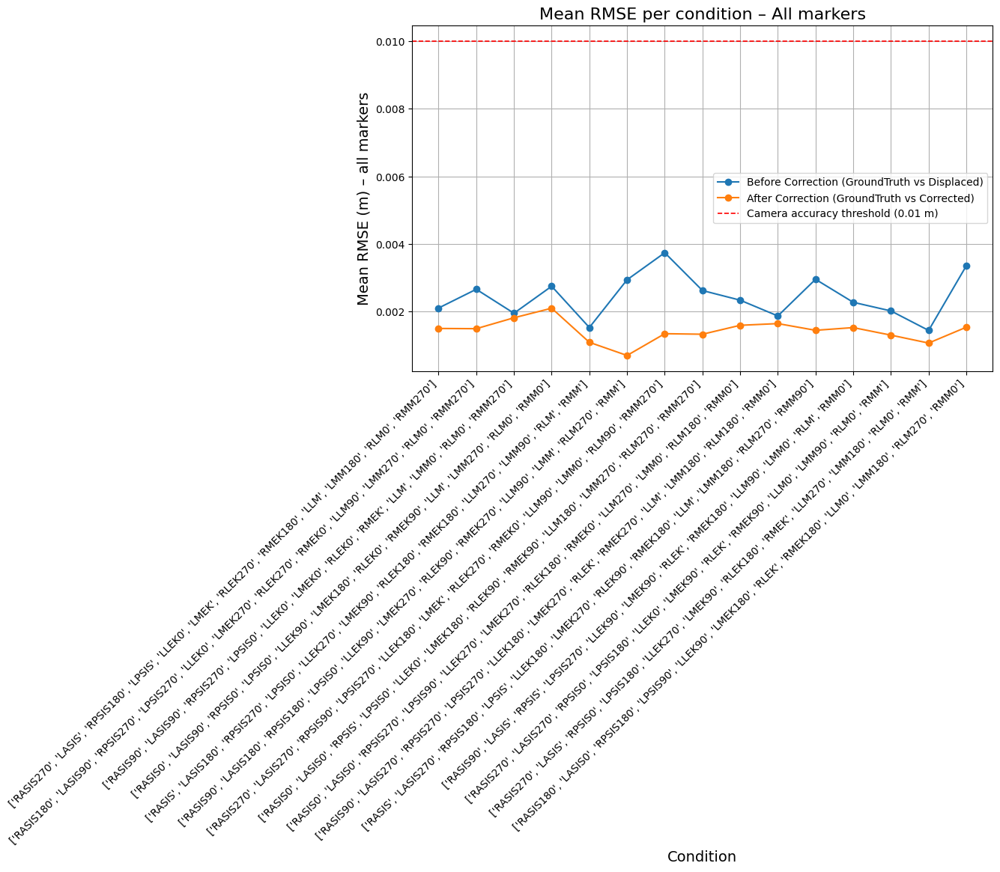


=== Detailed analysis per marker ===

🟢 RASIS
  Mean BEFORE : 0.0041
  Mean AFTER  : 0.0022
  t-test    : t = 5.667, p = 0.0001 → Significant
  Wilcoxon  : W = 0.000, p = 0.0001 → Significant


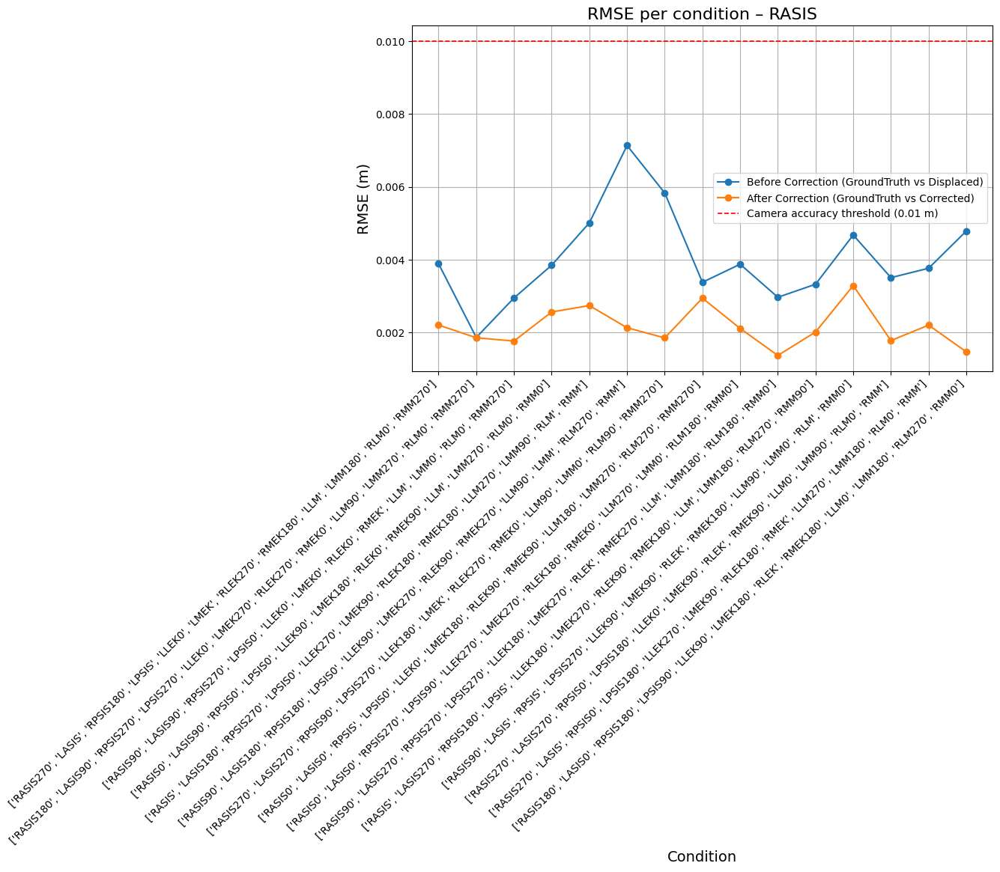


🟢 LASIS
  Mean BEFORE : 0.0038
  Mean AFTER  : 0.0022
  t-test    : t = 4.011, p = 0.0013 → Significant
  Wilcoxon  : W = 8.000, p = 0.0015 → Significant


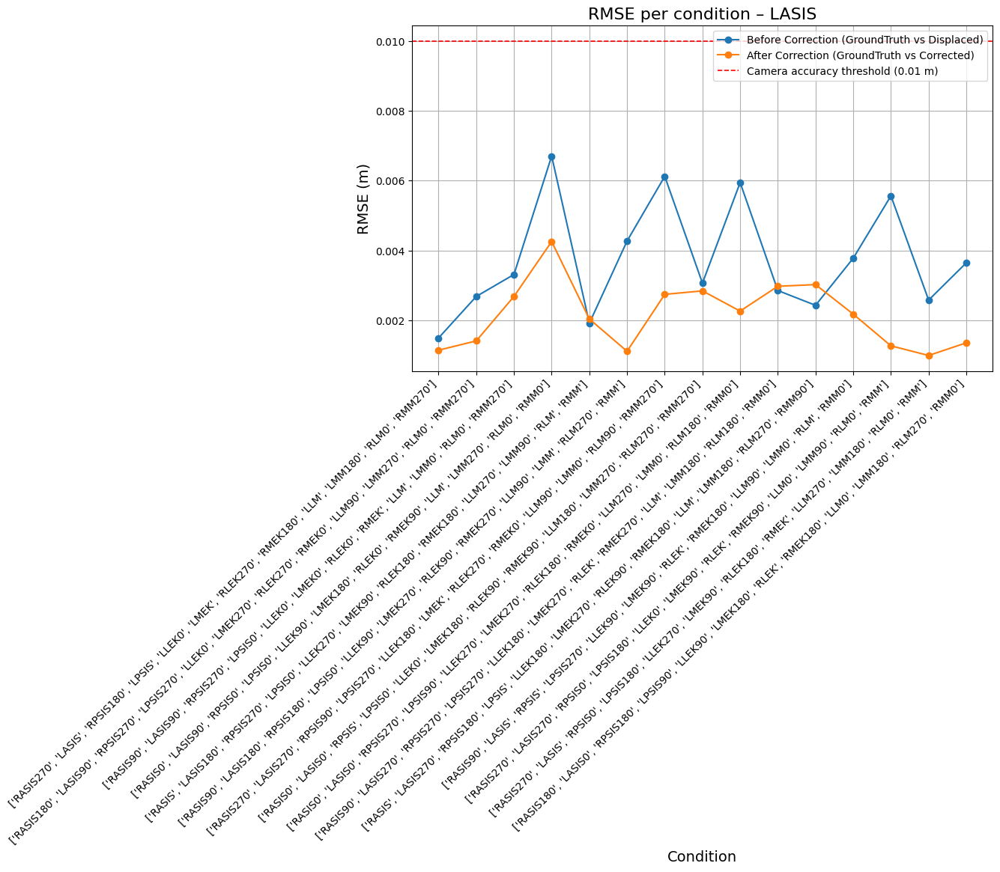


🟢 RPSIS
  Mean BEFORE : 0.0025
  Mean AFTER  : 0.0020
  t-test    : t = 1.951, p = 0.0714 → Not significant
  Wilcoxon  : W = 28.000, p = 0.0730 → Not significant


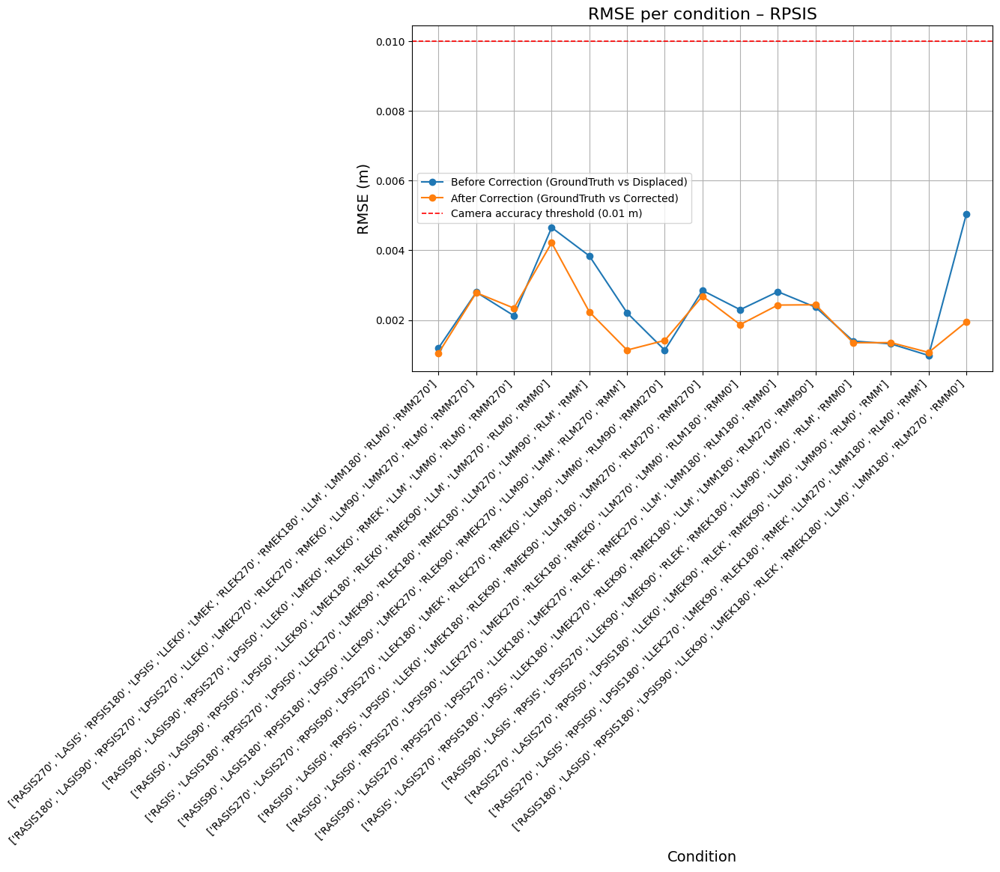


🟢 LPSIS
  Mean BEFORE : 0.0026
  Mean AFTER  : 0.0022
  t-test    : t = 2.044, p = 0.0603 → Not significant
  Wilcoxon  : W = 29.000, p = 0.0833 → Not significant


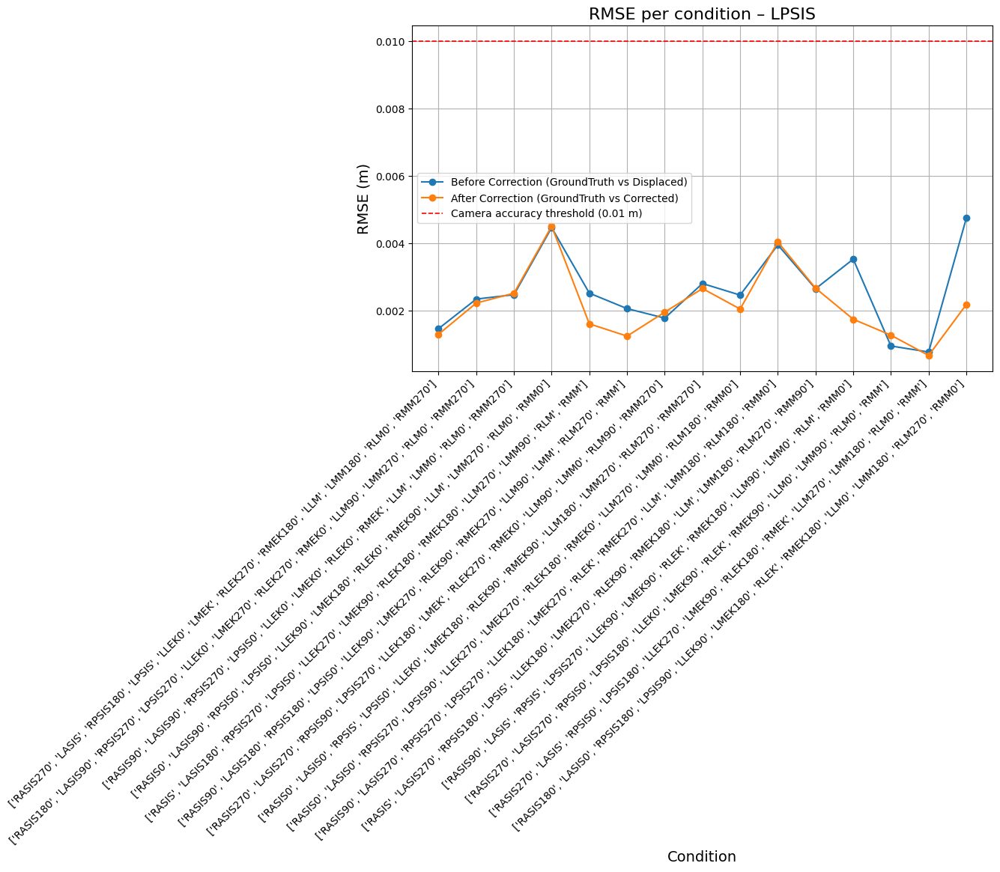


🟢 LLEK
  Mean BEFORE : 0.0029
  Mean AFTER  : 0.0018
  t-test    : t = 4.757, p = 0.0003 → Significant
  Wilcoxon  : W = 0.000, p = 0.0001 → Significant


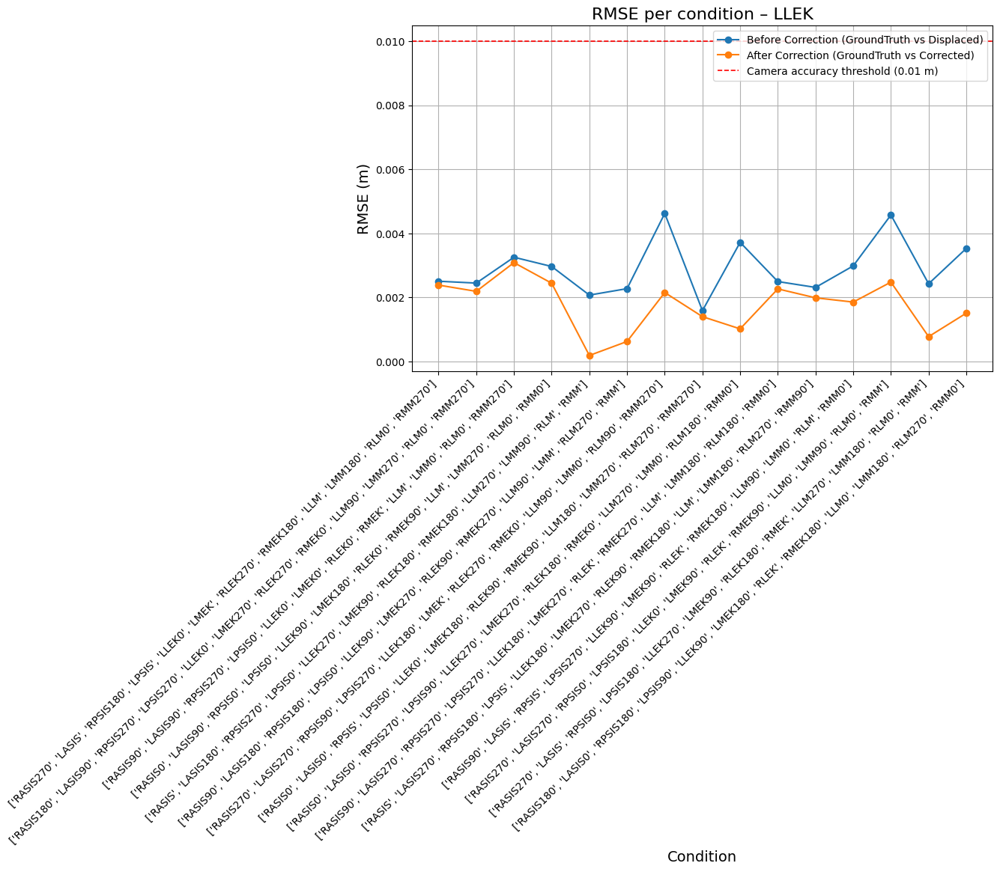


🟢 LMEK
  Mean BEFORE : 0.0032
  Mean AFTER  : 0.0020
  t-test    : t = 4.313, p = 0.0007 → Significant
  Wilcoxon  : W = 0.000, p = 0.0001 → Significant


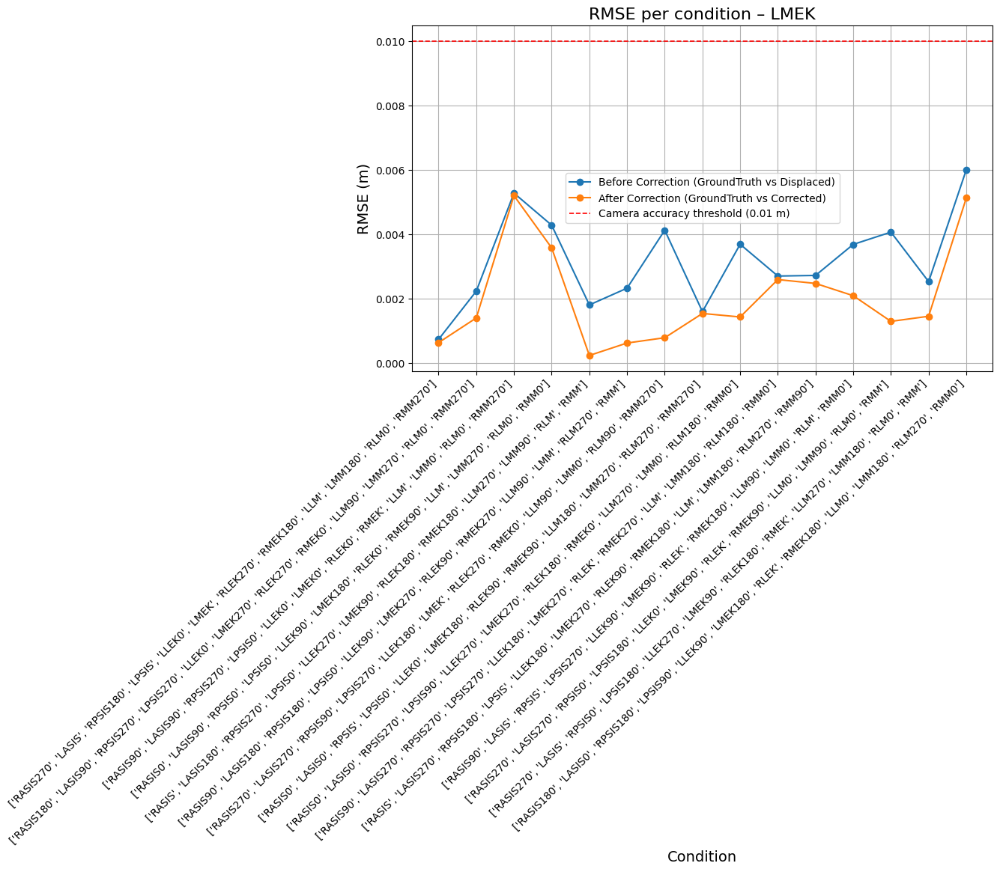


🟢 RLEK
  Mean BEFORE : 0.0030
  Mean AFTER  : 0.0017
  t-test    : t = 4.123, p = 0.0010 → Significant
  Wilcoxon  : W = 7.000, p = 0.0012 → Significant


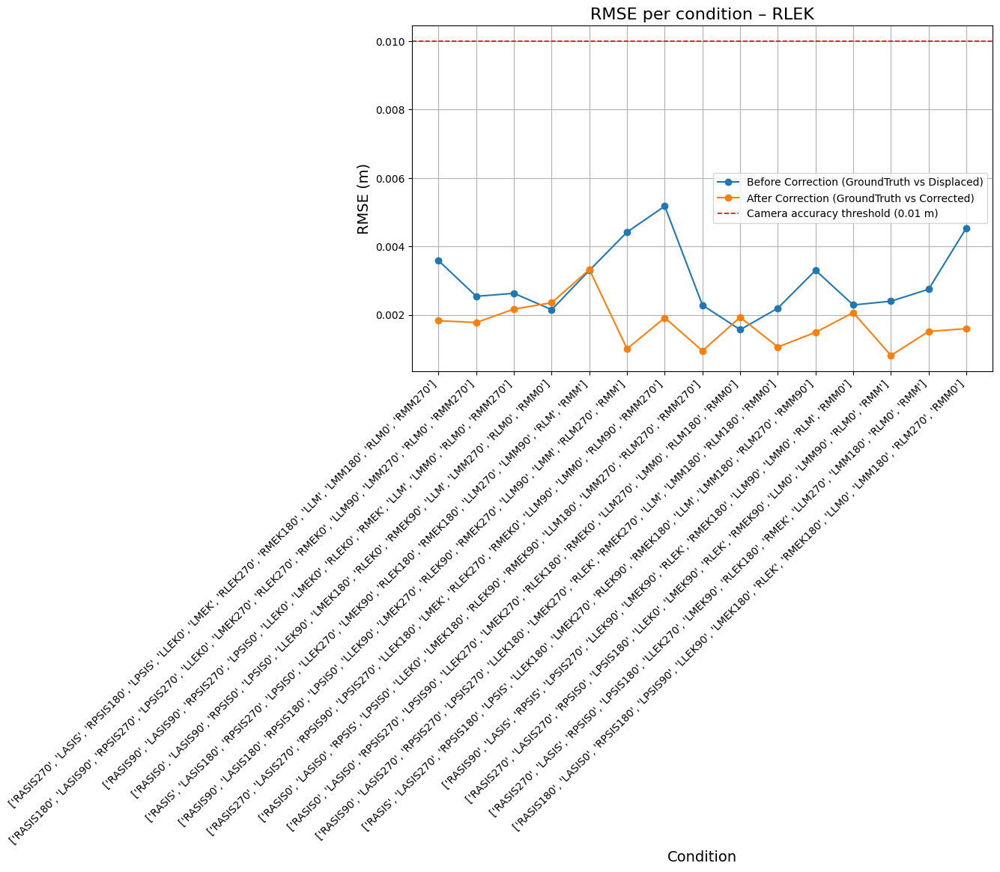


🟢 RMEK
  Mean BEFORE : 0.0034
  Mean AFTER  : 0.0022
  t-test    : t = 4.307, p = 0.0007 → Significant
  Wilcoxon  : W = 4.000, p = 0.0004 → Significant


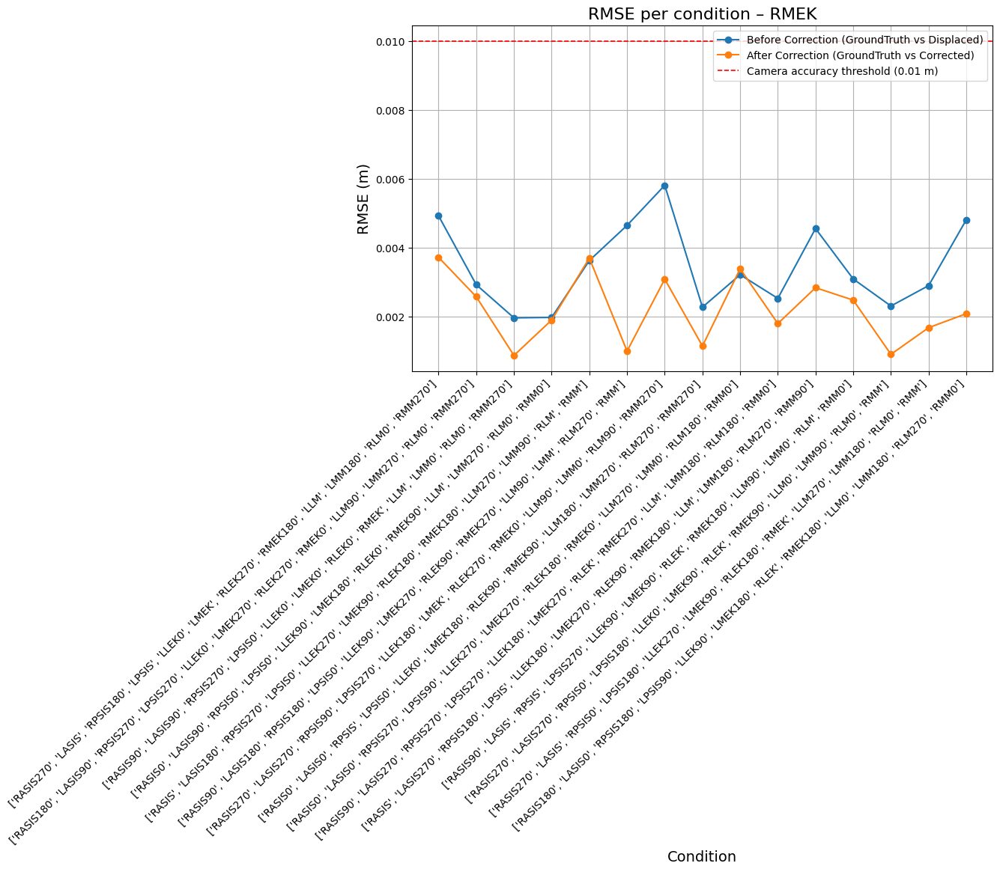


🟢 LLM
  Mean BEFORE : 0.0020
  Mean AFTER  : 0.0010
  t-test    : t = 3.009, p = 0.0094 → Significant
  Wilcoxon  : W = 16.000, p = 0.0103 → Significant


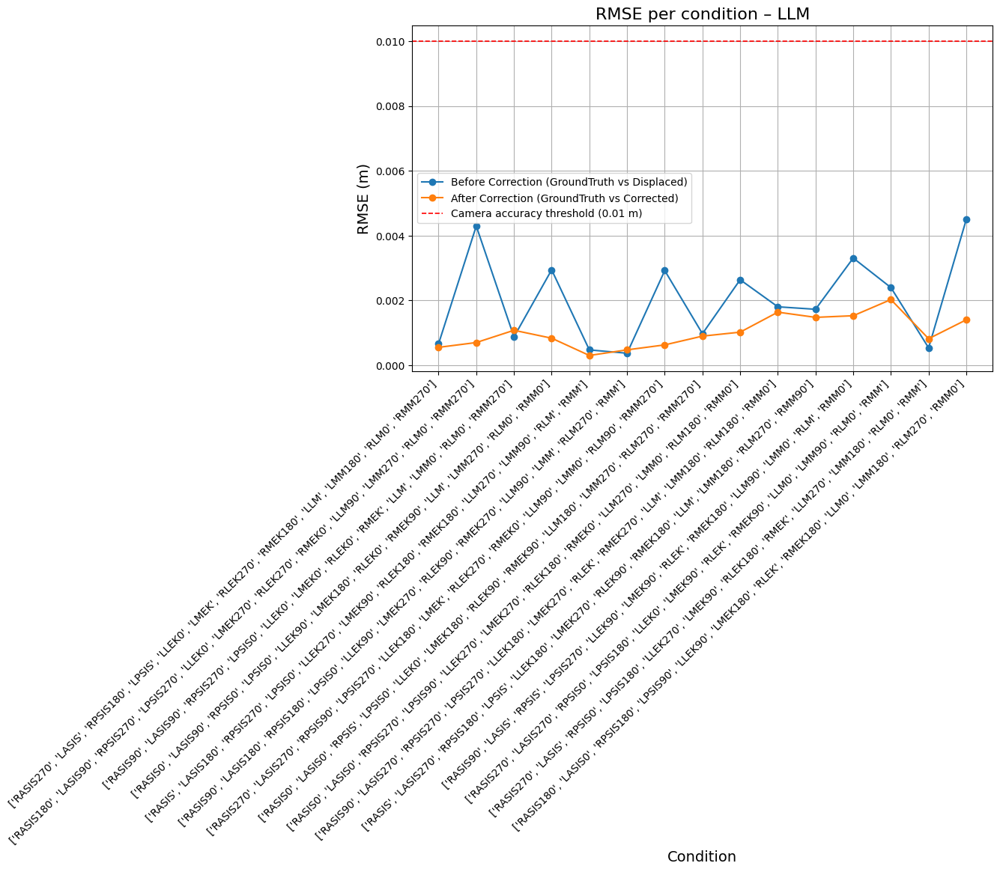


🟢 LMM
  Mean BEFORE : 0.0025
  Mean AFTER  : 0.0015
  t-test    : t = 3.067, p = 0.0084 → Significant
  Wilcoxon  : W = 11.000, p = 0.0034 → Significant


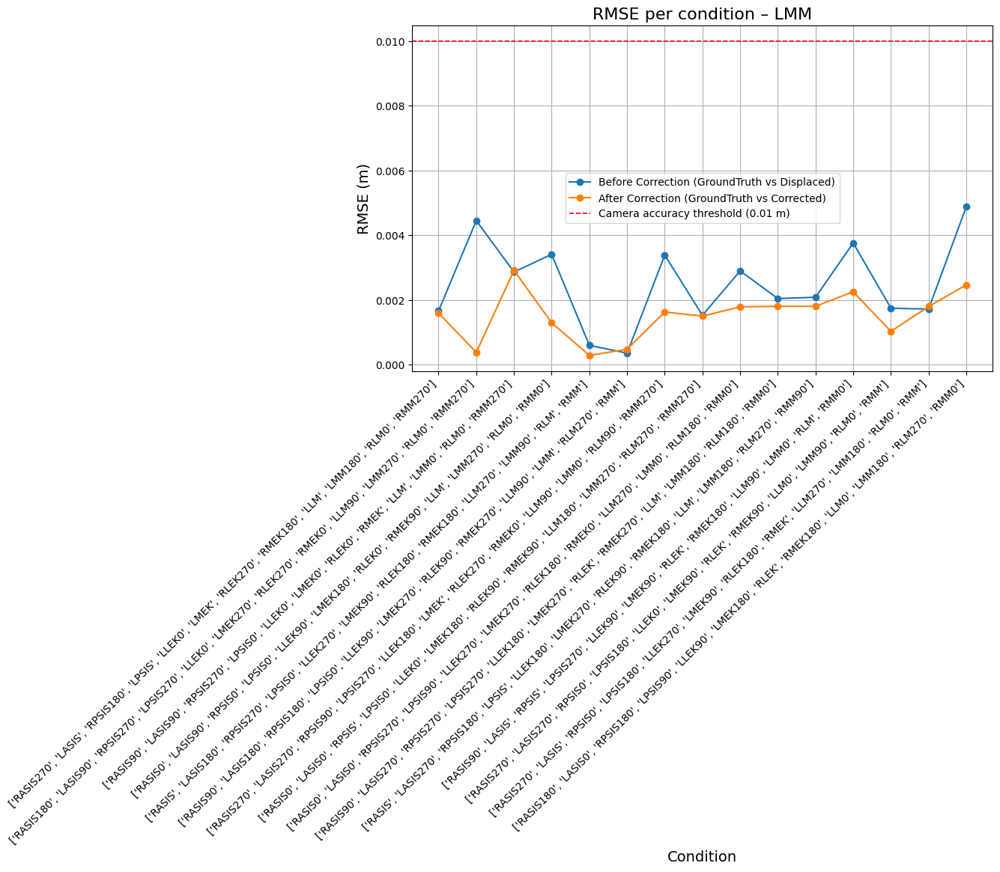


🟢 RLM
  Mean BEFORE : 0.0034
  Mean AFTER  : 0.0012
  t-test    : t = 3.162, p = 0.0069 → Significant
  Wilcoxon  : W = 13.000, p = 0.0054 → Significant


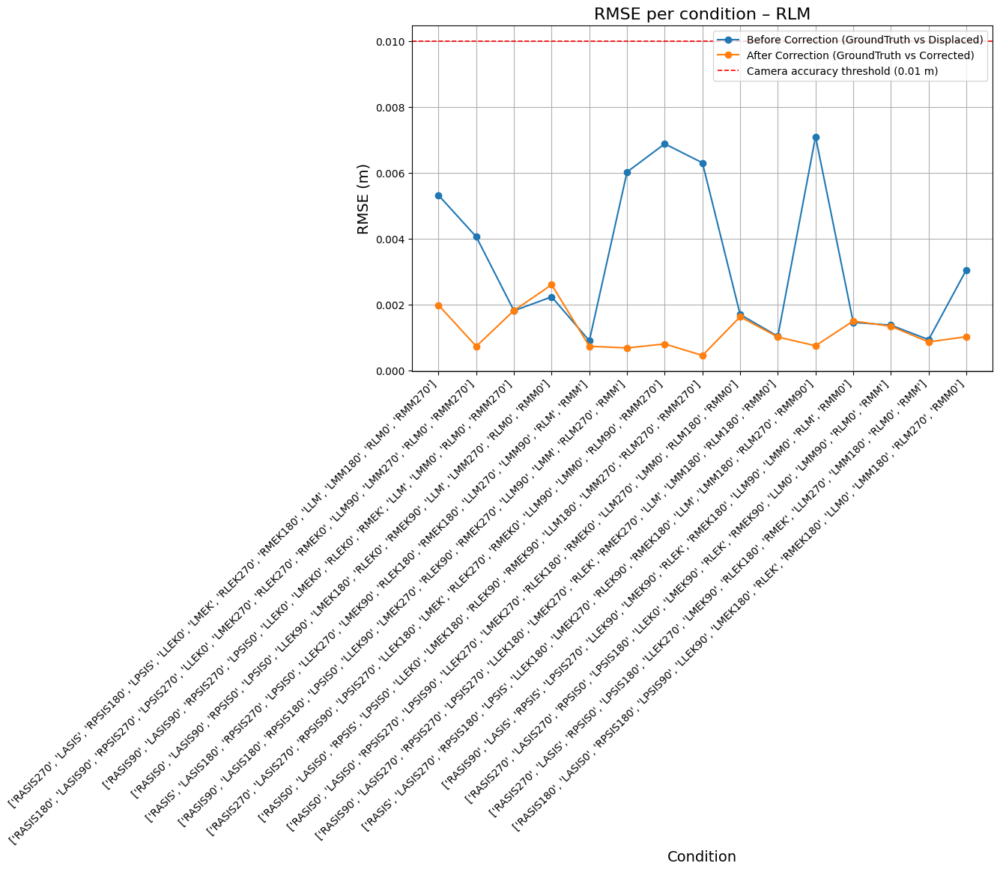


🟢 RMM
  Mean BEFORE : 0.0033
  Mean AFTER  : 0.0011
  t-test    : t = 3.158, p = 0.0070 → Significant
  Wilcoxon  : W = 18.000, p = 0.0151 → Significant


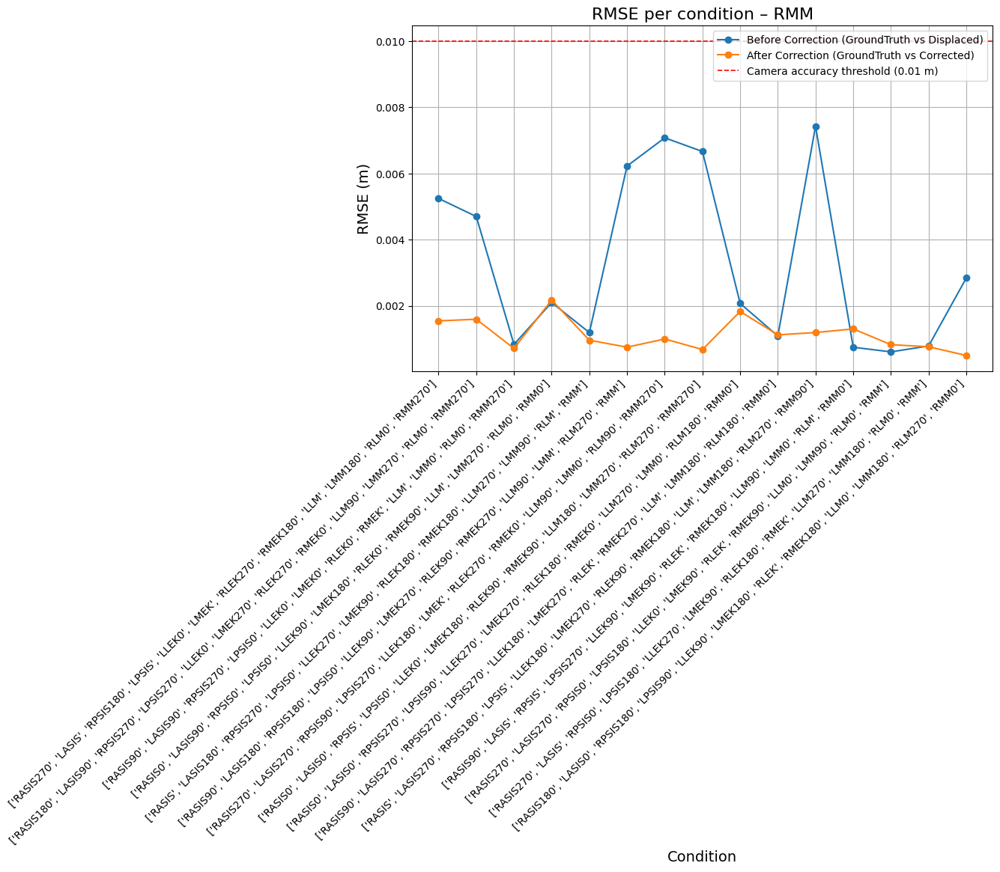


🟢 LLTHI
  Mean BEFORE : 0.0028
  Mean AFTER  : 0.0015
  t-test    : t = 4.545, p = 0.0005 → Significant
  Wilcoxon  : W = 2.000, p = 0.0002 → Significant


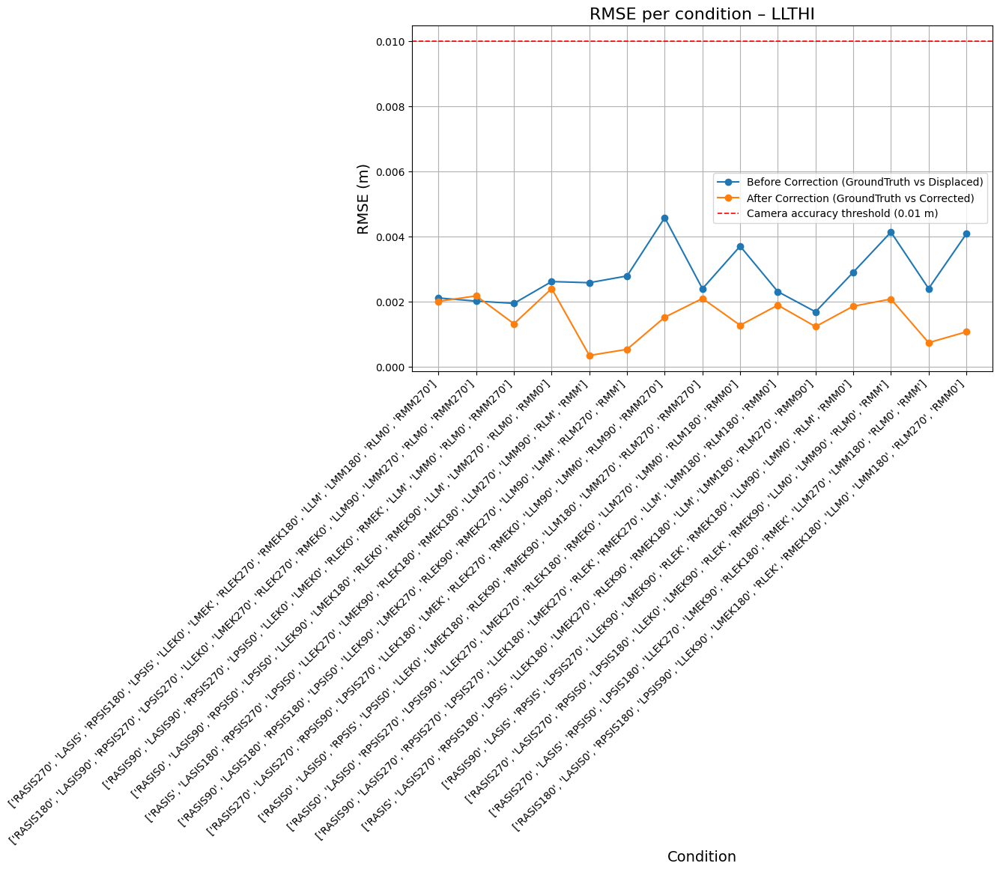


🟢 LLSHA
  Mean BEFORE : 0.0023
  Mean AFTER  : 0.0012
  t-test    : t = 3.155, p = 0.0070 → Significant
  Wilcoxon  : W = 8.000, p = 0.0015 → Significant


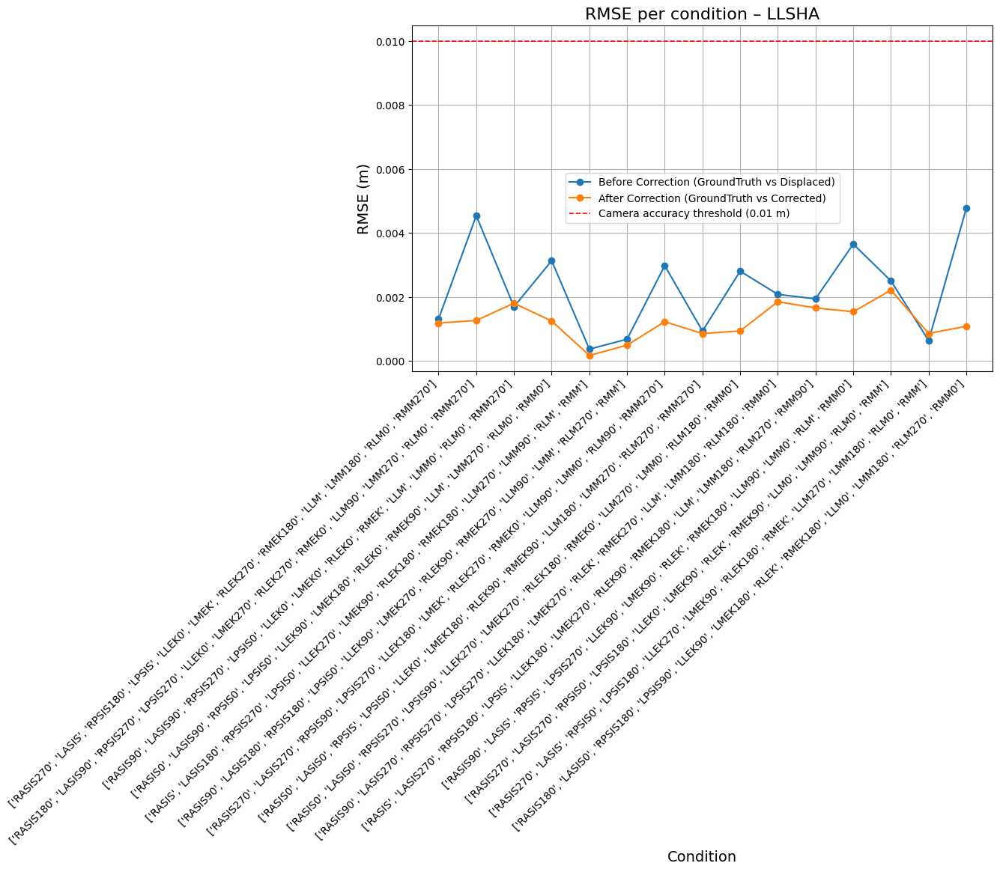


🟢 LHEE
  Mean BEFORE : 0.0026
  Mean AFTER  : 0.0015
  t-test    : t = 4.018, p = 0.0013 → Significant
  Wilcoxon  : W = 10.000, p = 0.0026 → Significant


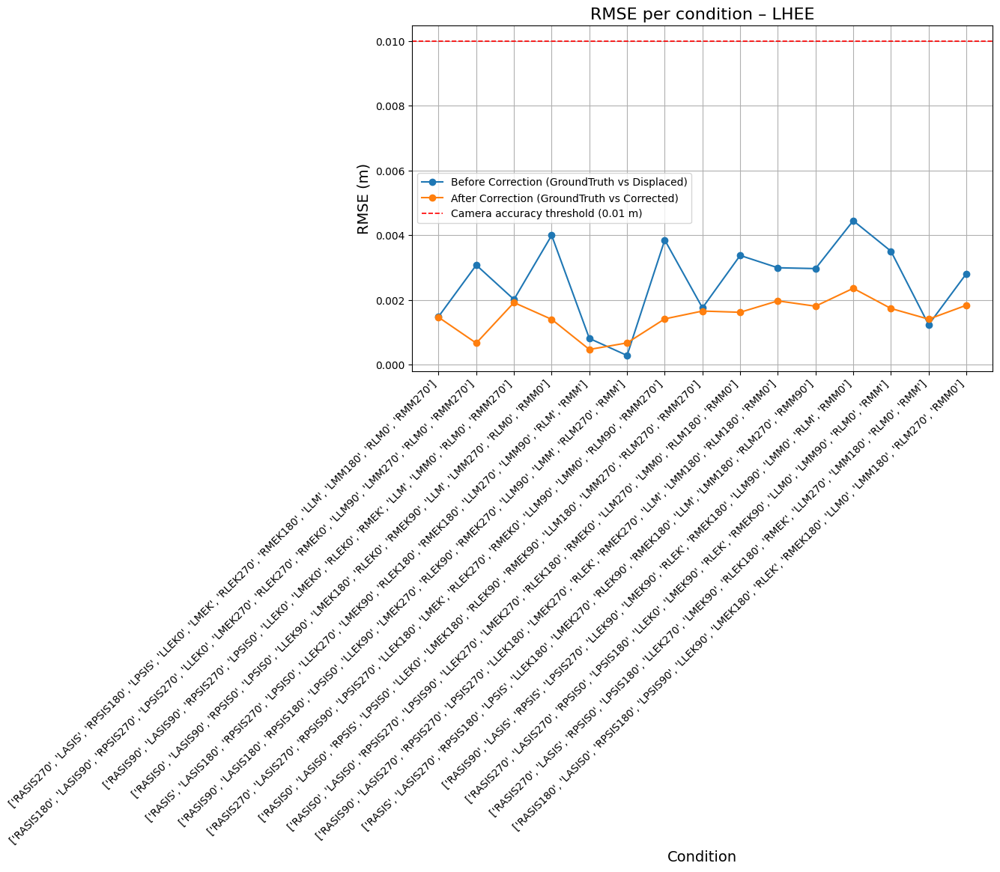


🟢 LMT2
  Mean BEFORE : 0.0011
  Mean AFTER  : 0.0008
  t-test    : t = 2.556, p = 0.0228 → Significant
  Wilcoxon  : W = 21.000, p = 0.0256 → Significant


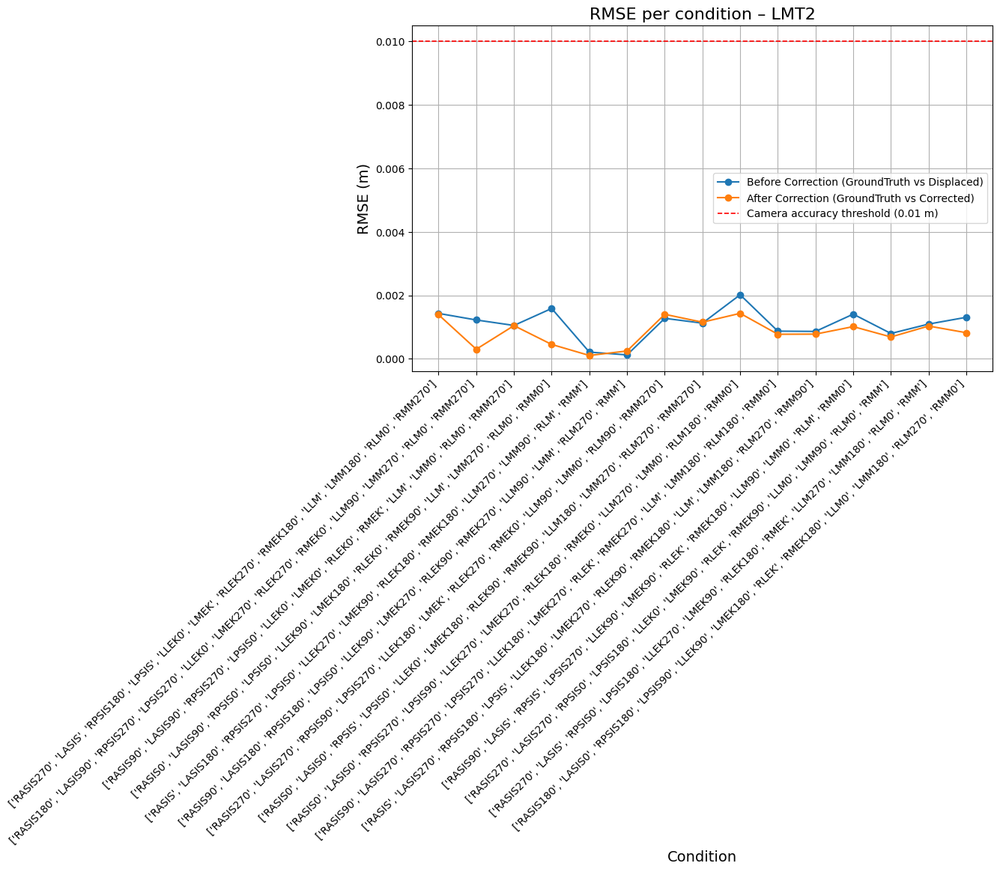


🟢 LMT5
  Mean BEFORE : 0.0012
  Mean AFTER  : 0.0010
  t-test    : t = 2.002, p = 0.0651 → Not significant
  Wilcoxon  : W = 28.000, p = 0.0730 → Not significant


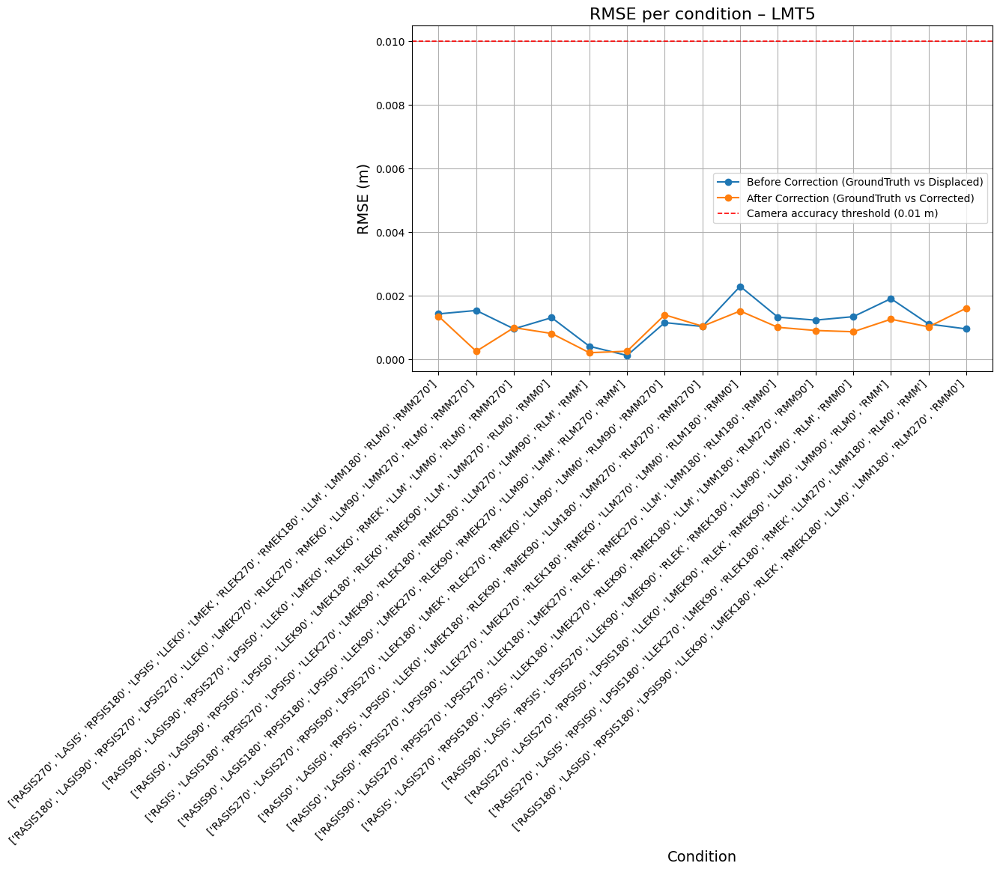


🟢 RLTHI
  Mean BEFORE : 0.0030
  Mean AFTER  : 0.0016
  t-test    : t = 4.124, p = 0.0010 → Significant
  Wilcoxon  : W = 3.000, p = 0.0003 → Significant


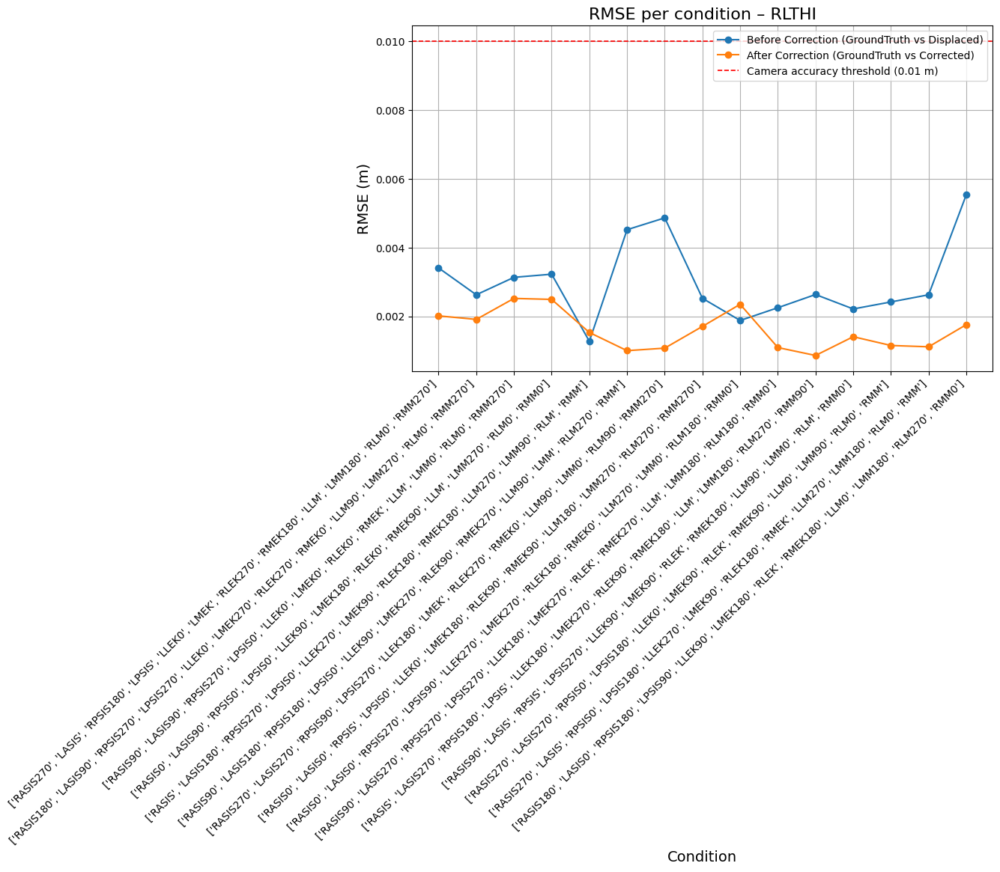


🟢 RLSHA
  Mean BEFORE : 0.0033
  Mean AFTER  : 0.0012
  t-test    : t = 3.089, p = 0.0080 → Significant
  Wilcoxon  : W = 24.000, p = 0.0413 → Significant


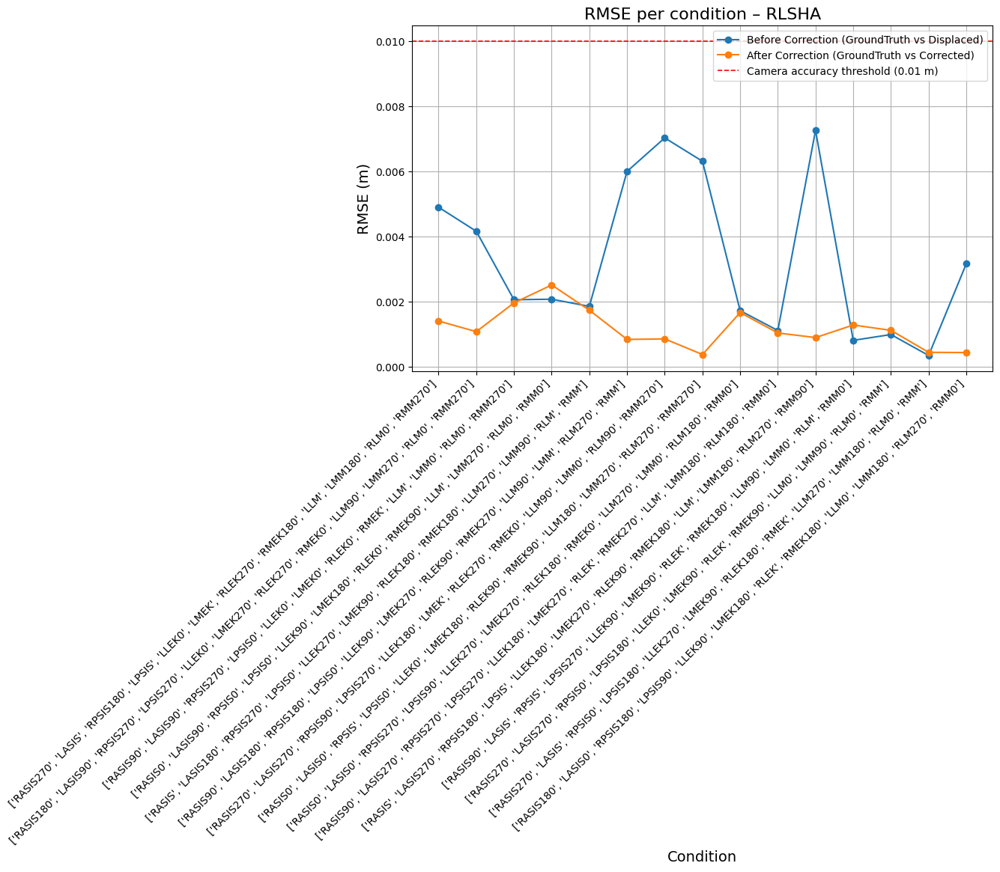


🟢 RHEE
  Mean BEFORE : 0.0034
  Mean AFTER  : 0.0016
  t-test    : t = 2.423, p = 0.0296 → Significant
  Wilcoxon  : W = 38.000, p = 0.2293 → Not significant


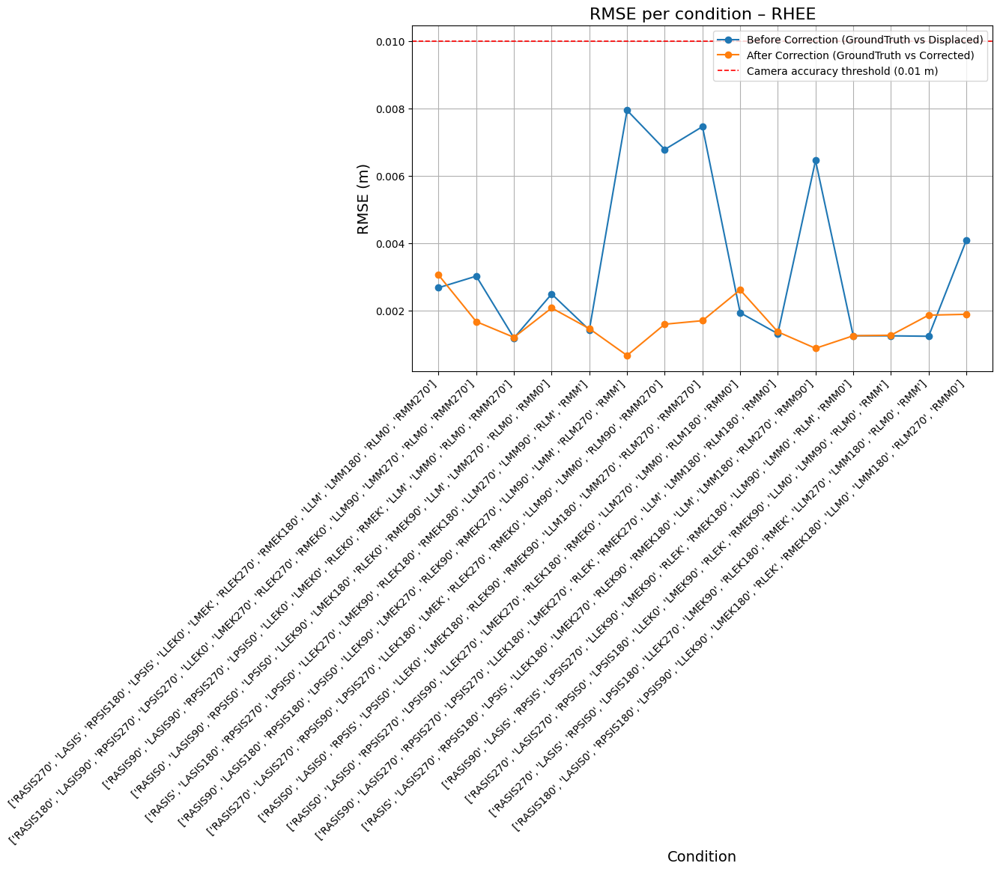


🟢 RMT2
  Mean BEFORE : 0.0016
  Mean AFTER  : 0.0011
  t-test    : t = 1.548, p = 0.1439 → Not significant
  Wilcoxon  : W = 48.000, p = 0.5245 → Not significant


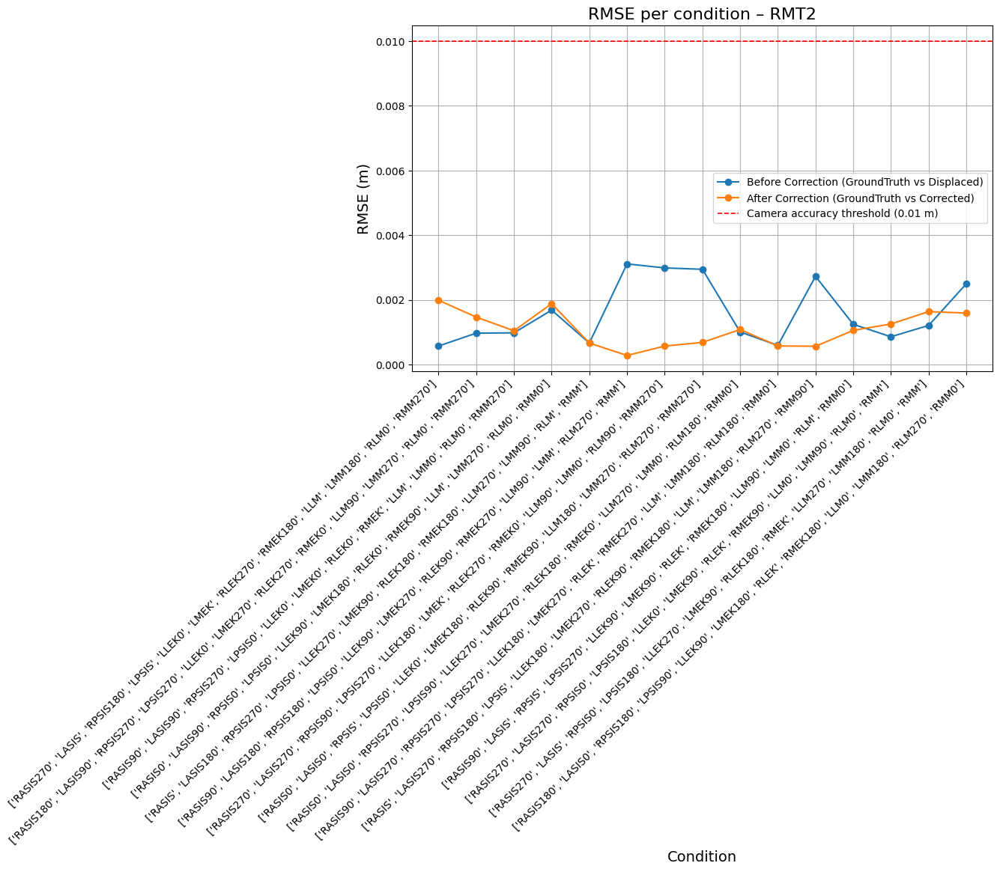


🟢 RMT5
  Mean BEFORE : 0.0018
  Mean AFTER  : 0.0012
  t-test    : t = 1.891, p = 0.0795 → Not significant
  Wilcoxon  : W = 46.000, p = 0.4543 → Not significant


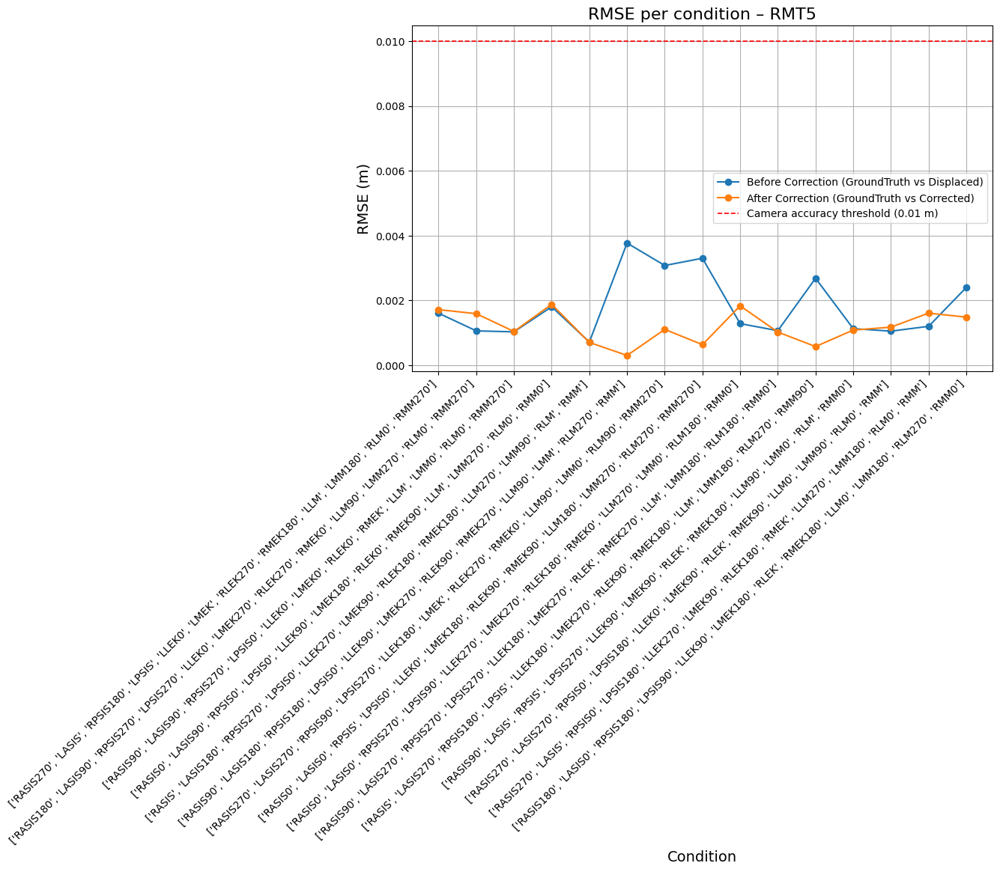


🟢 C7
  Mean BEFORE : 0.0008
  Mean AFTER  : 0.0008
  t-test    : t = 0.446, p = 0.6624 → Not significant
  Wilcoxon  : W = 56.000, p = 0.8469 → Not significant


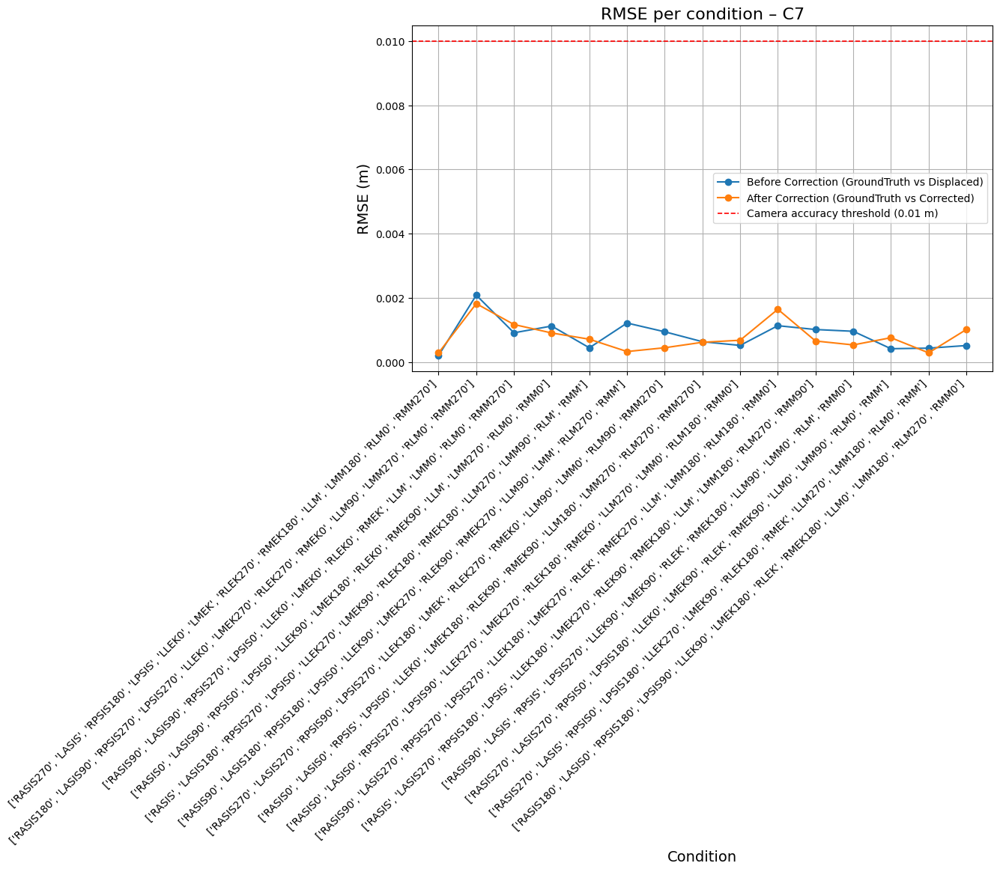


🟢 T10
  Mean BEFORE : 0.0012
  Mean AFTER  : 0.0011
  t-test    : t = 1.474, p = 0.1626 → Not significant
  Wilcoxon  : W = 36.000, p = 0.1876 → Not significant


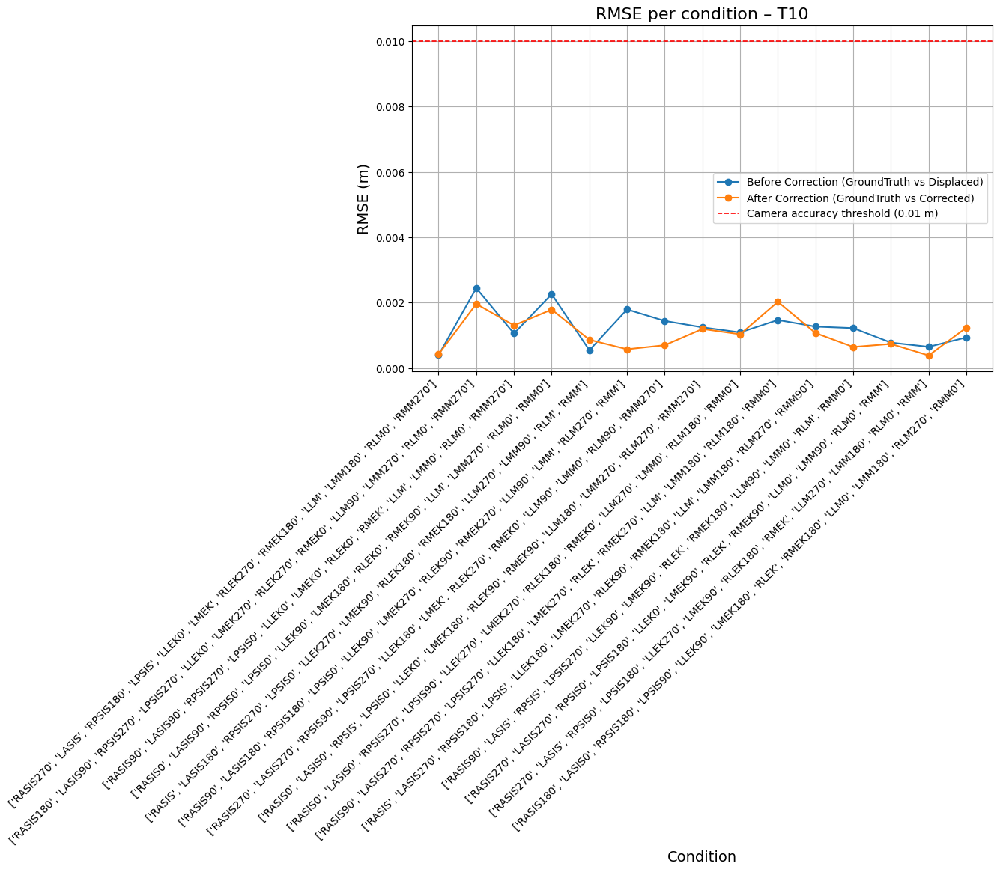


🟢 XIPH
  Mean BEFORE : 0.0010
  Mean AFTER  : 0.0009
  t-test    : t = 0.959, p = 0.3538 → Not significant
  Wilcoxon  : W = 46.000, p = 0.4543 → Not significant


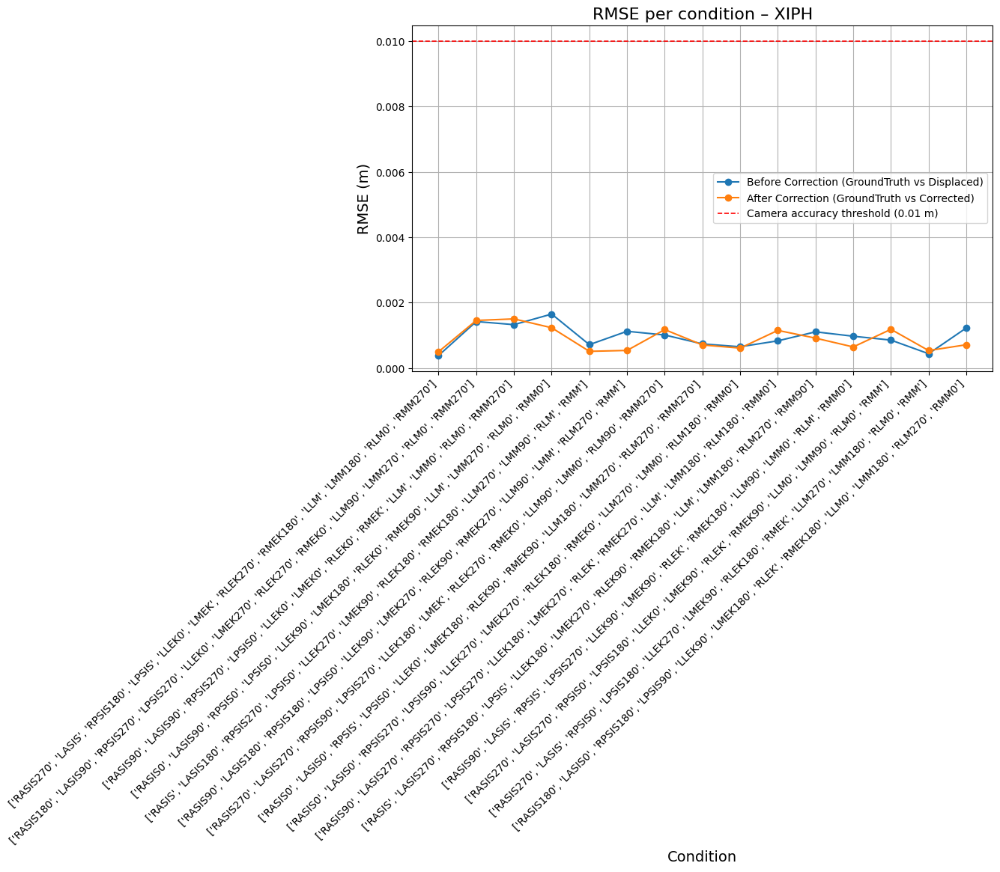


🟢 JN
  Mean BEFORE : 0.0007
  Mean AFTER  : 0.0007
  t-test    : t = -0.811, p = 0.4312 → Not significant
  Wilcoxon  : W = 42.000, p = 0.3303 → Not significant


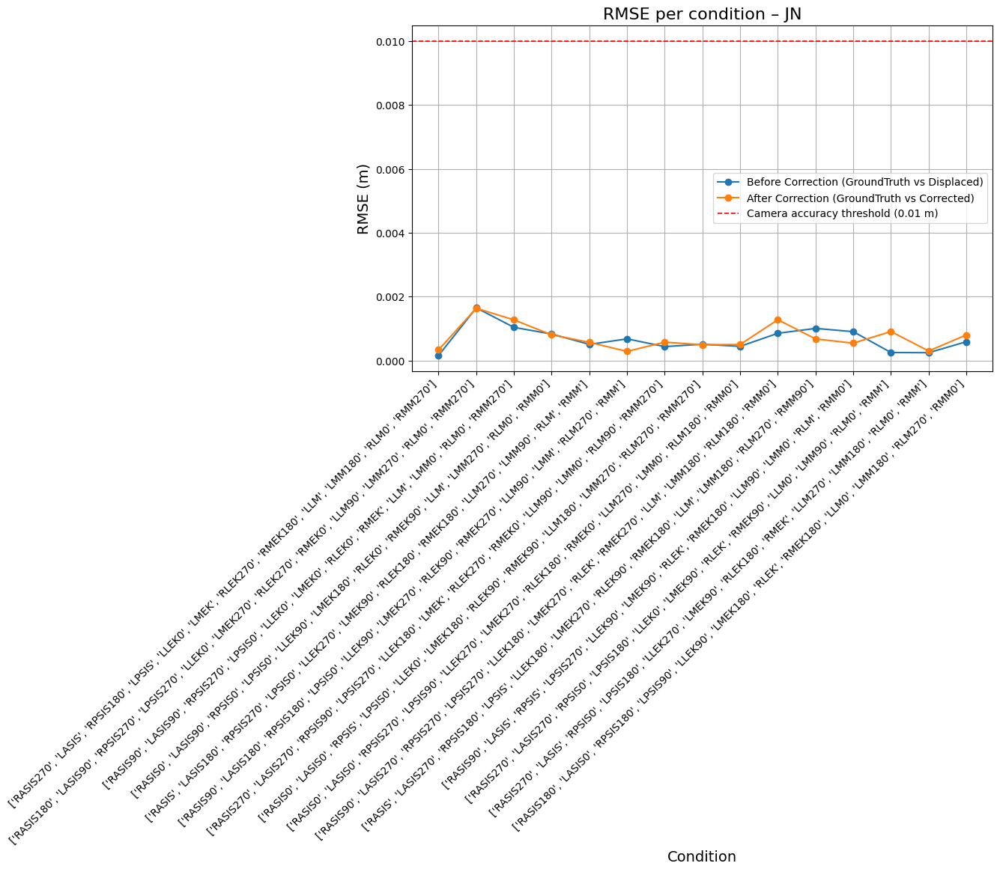


=== Bar Chart: Mean RMSE Before vs After per Marker ===


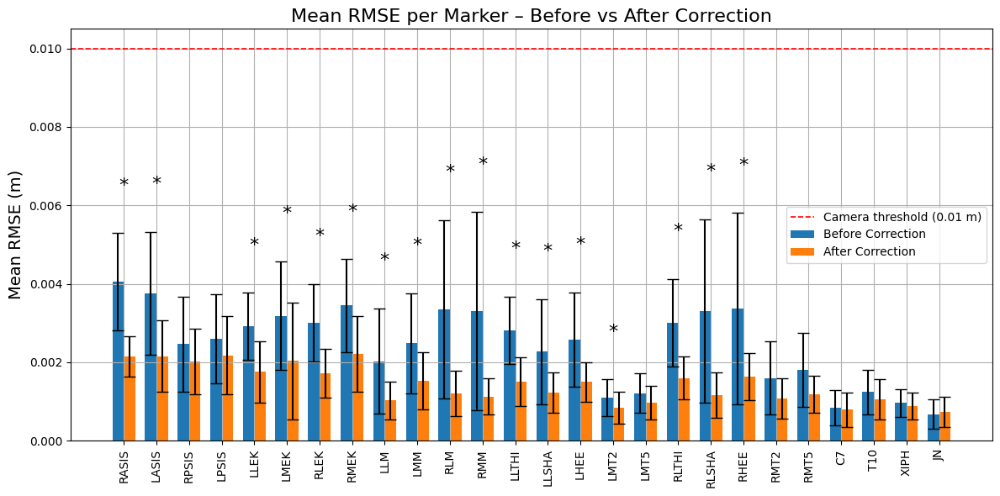

In [7]:
per_marker_b, per_marker_a, global_b, global_a = analyze_correction_effect_per_day_with_marker_details__(
    ground_truth_path=path_to_gt_pointkin_pointkin_walking_trc,
    files_before = displaced_pointkin_walk_trcs,
    files_after= averaged_pointkin_walk_trcs,
    markers_to_compare=ALL_MARKERS,
    t_min=0.0,
    t_max=10,
    combo_list=COMBOS
)


=== Global Kinematic Analysis ===
Mean Error BEFORE correction : 1.7888
Mean Error AFTER correction : 1.0835
t-test     : t = 7.865, p = 0.0000 → Significant
Wilcoxon   : W = 0.000, p = 0.0001 → Significant


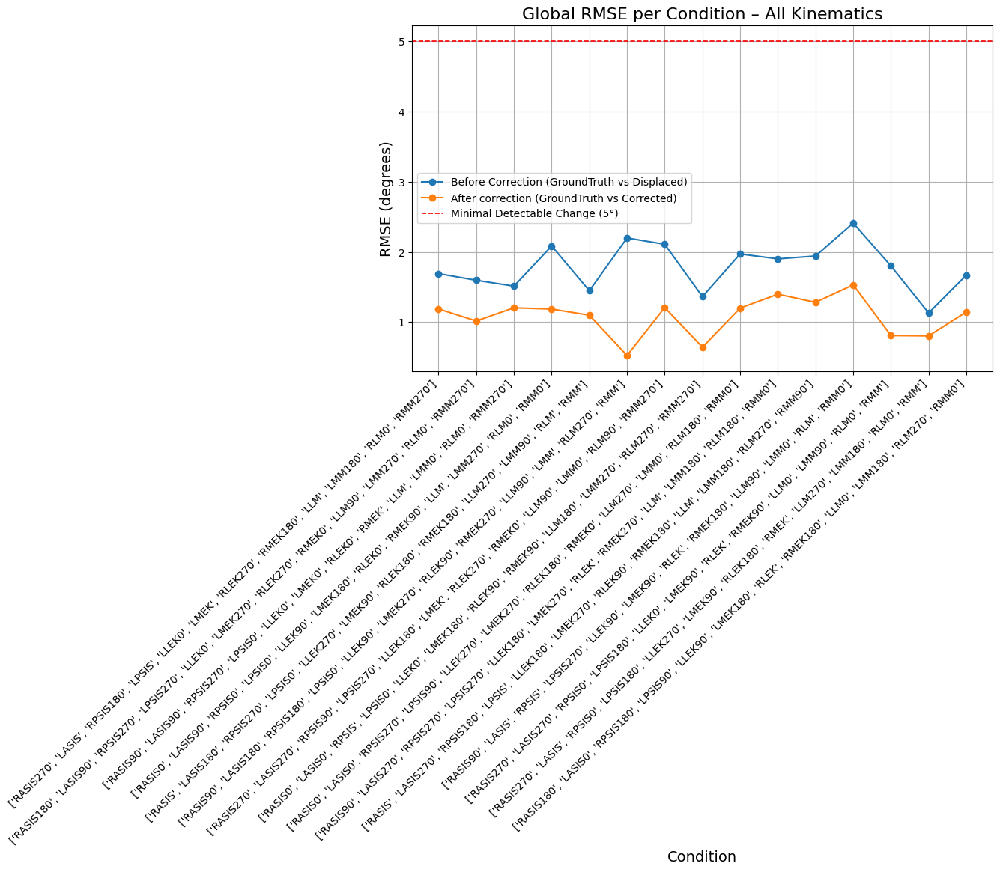


=== Per-Kinematic Analysis ===

🟢 pelvis_tilt
  Mean BEFORE : 2.1001
  Mean AFTER  : 1.0710
  t-test    : t = 2.994, p = 0.0097 → Significant
  Wilcoxon  : W = 15.000, p = 0.0084 → Significant


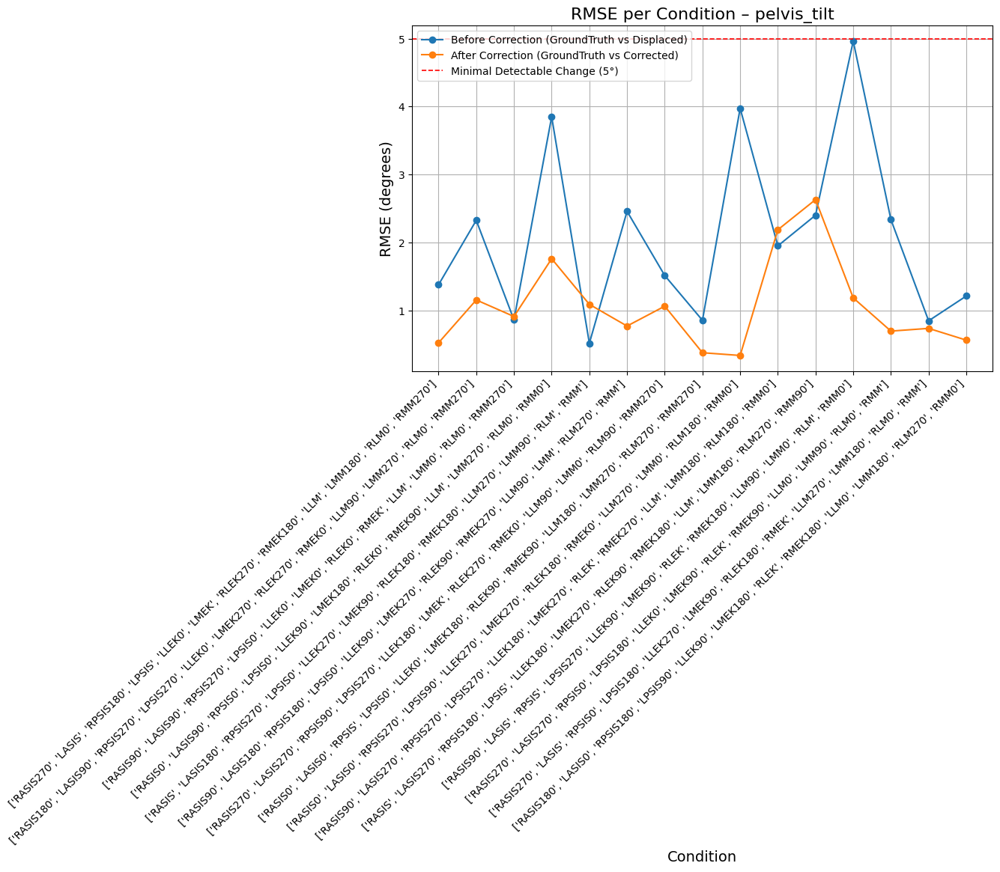


🟢 pelvis_list
  Mean BEFORE : 2.3345
  Mean AFTER  : 1.0293
  t-test    : t = 4.296, p = 0.0007 → Significant
  Wilcoxon  : W = 3.000, p = 0.0003 → Significant


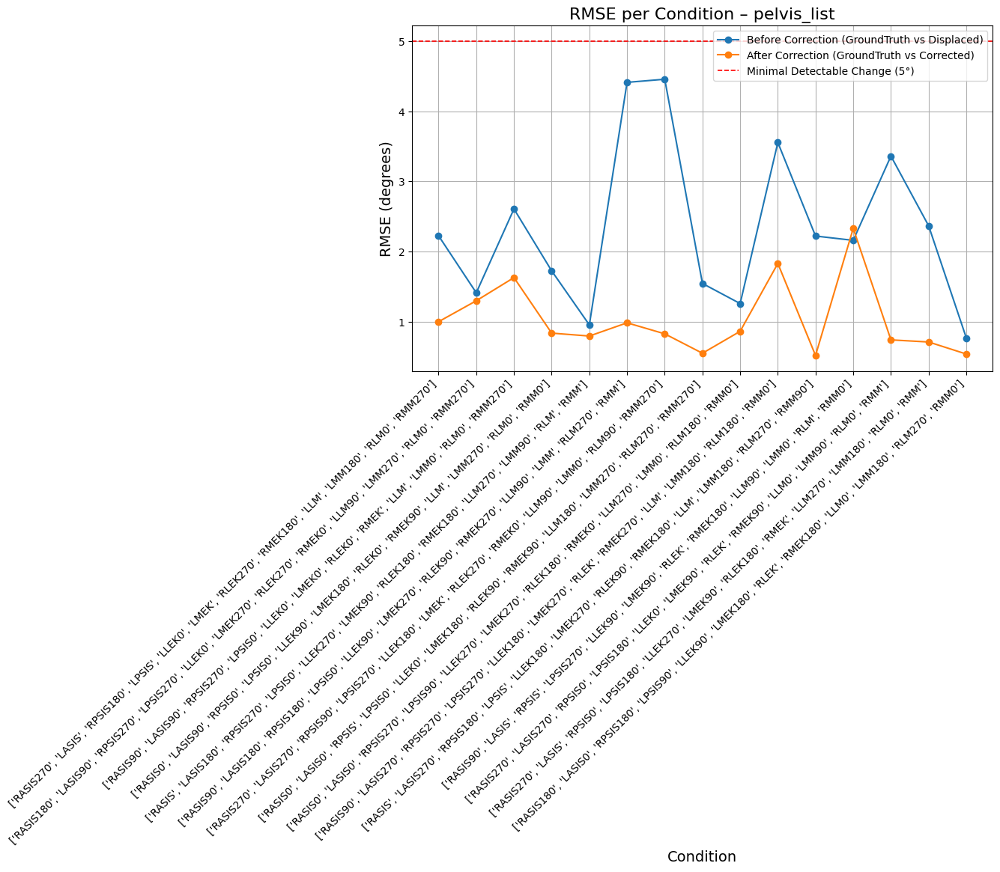


🟢 pelvis_rotation
  Mean BEFORE : 1.2217
  Mean AFTER  : 1.0519
  t-test    : t = 2.336, p = 0.0349 → Significant
  Wilcoxon  : W = 21.000, p = 0.0256 → Significant


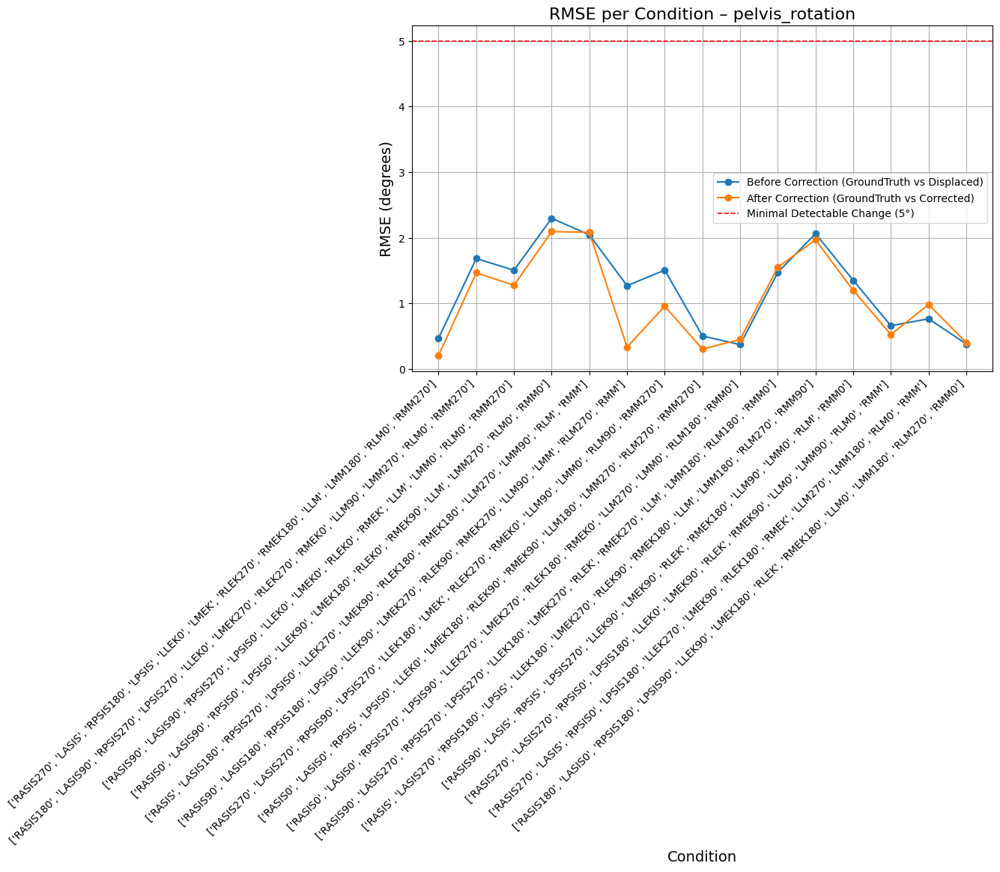


🟢 hip_flexion_r
  Mean BEFORE : 3.1939
  Mean AFTER  : 1.3793
  t-test    : t = 4.935, p = 0.0002 → Significant
  Wilcoxon  : W = 5.000, p = 0.0006 → Significant


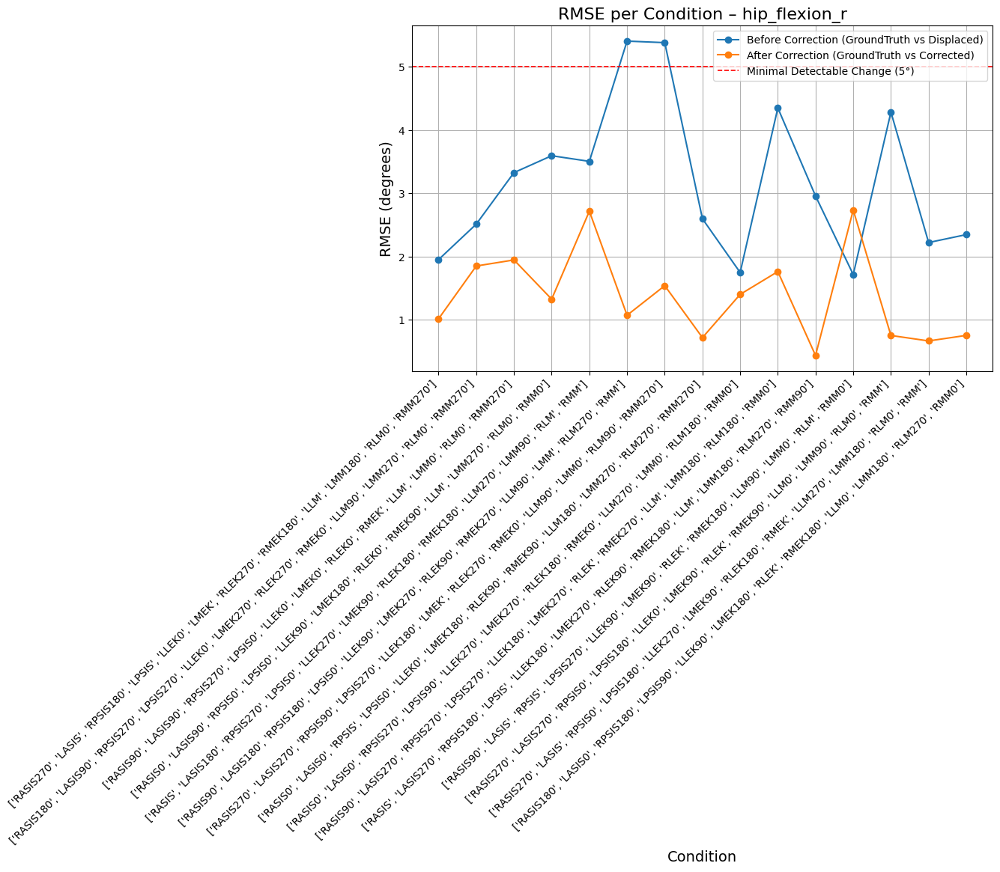


🟢 hip_adduction_r
  Mean BEFORE : 2.0860
  Mean AFTER  : 0.8483
  t-test    : t = 3.873, p = 0.0017 → Significant
  Wilcoxon  : W = 2.000, p = 0.0002 → Significant


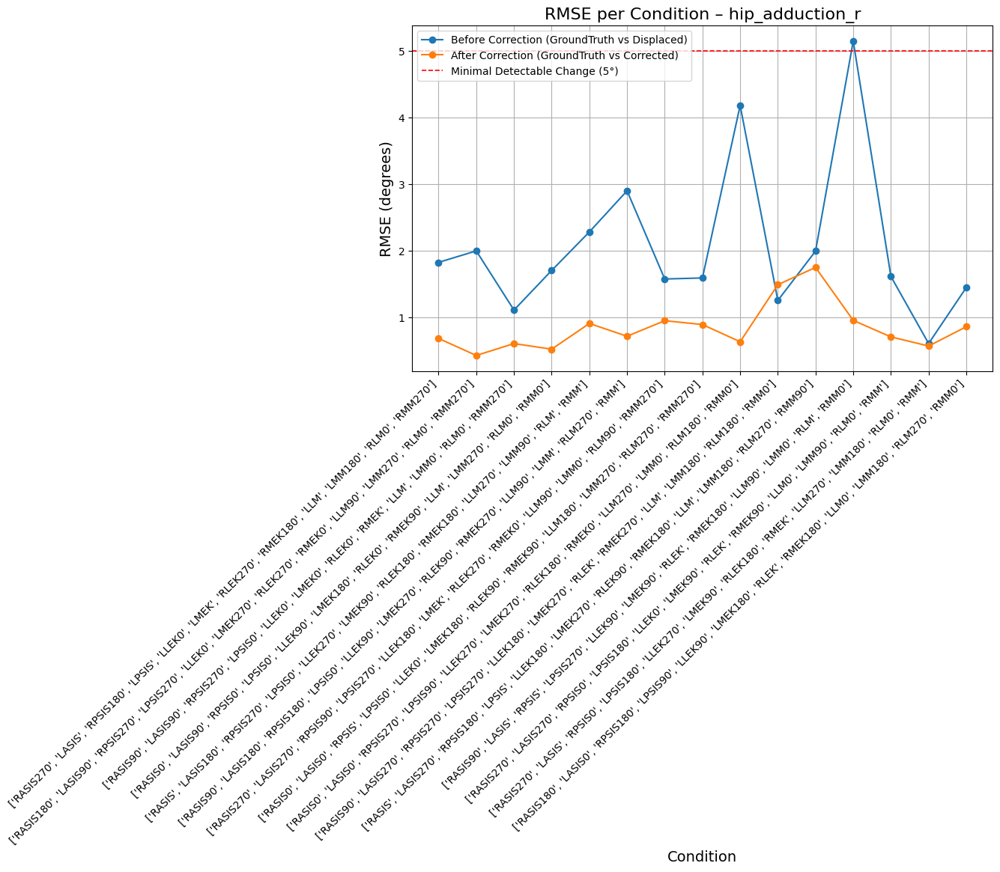


🟢 hip_rotation_r
  Mean BEFORE : 1.9276
  Mean AFTER  : 1.4640
  t-test    : t = 2.869, p = 0.0124 → Significant
  Wilcoxon  : W = 19.000, p = 0.0181 → Significant


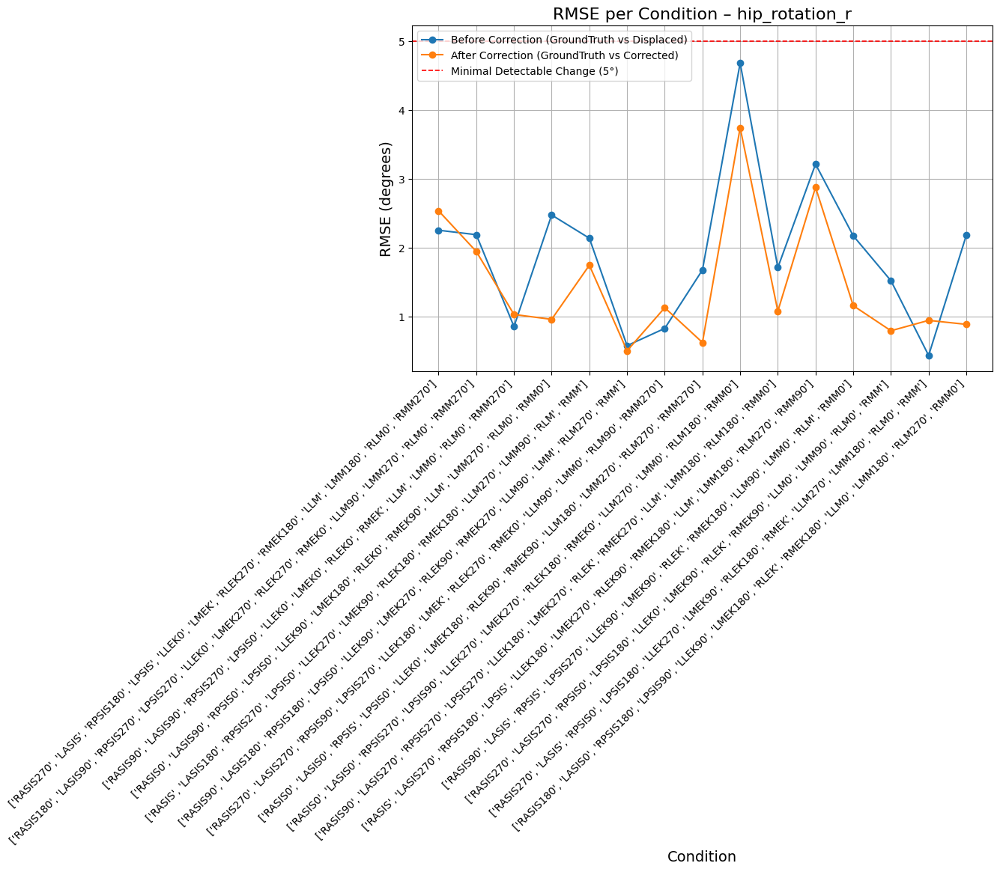


🟢 knee_angle_r
  Mean BEFORE : 1.3074
  Mean AFTER  : 0.7676
  t-test    : t = 3.694, p = 0.0024 → Significant
  Wilcoxon  : W = 11.000, p = 0.0034 → Significant


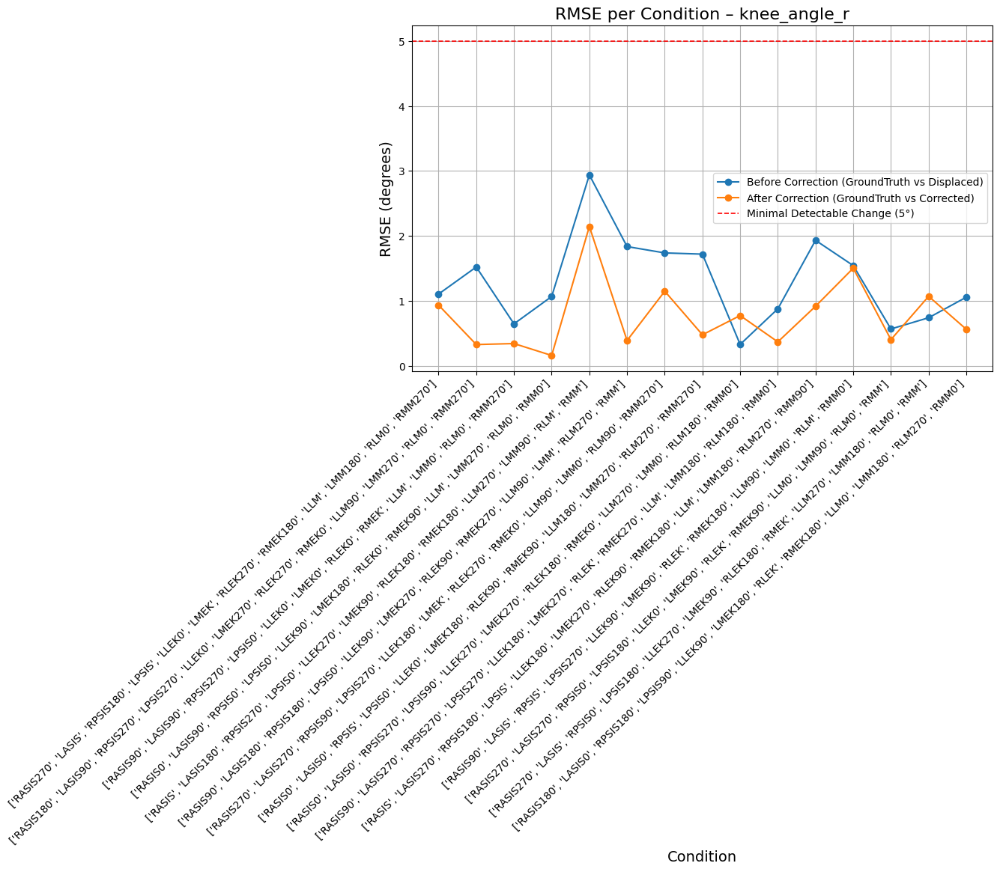


🟢 ankle_angle_r
  Mean BEFORE : 0.7674
  Mean AFTER  : 0.4842
  t-test    : t = 2.112, p = 0.0532 → Not significant
  Wilcoxon  : W = 34.000, p = 0.1514 → Not significant


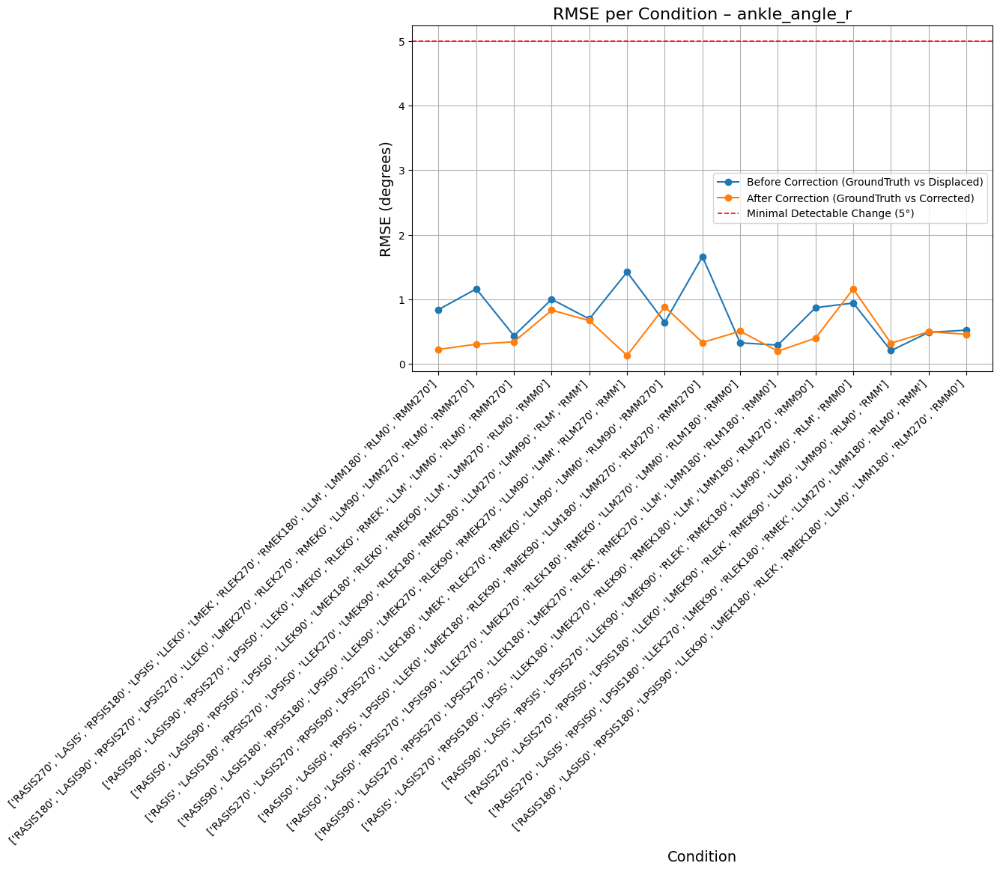


🟢 subtalar_angle_r
  Mean BEFORE : 1.6110
  Mean AFTER  : 1.3373
  t-test    : t = 2.020, p = 0.0629 → Not significant
  Wilcoxon  : W = 28.000, p = 0.0730 → Not significant


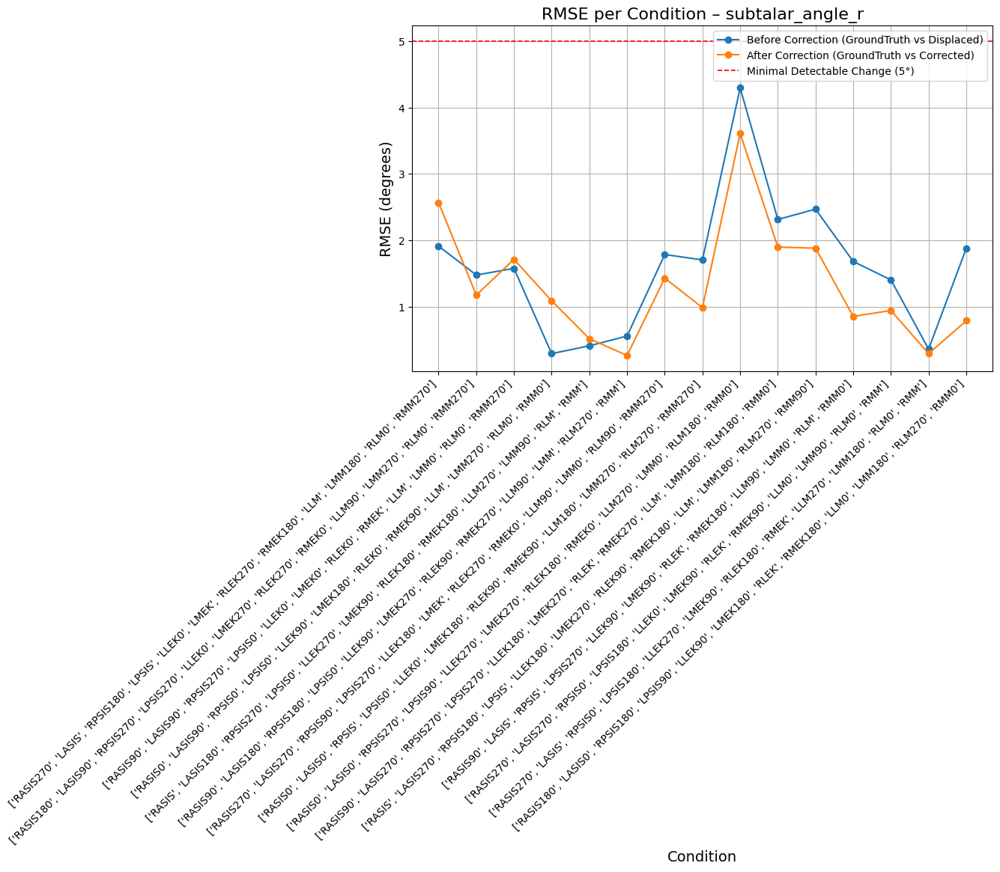


🟢 hip_flexion_l
  Mean BEFORE : 3.0798
  Mean AFTER  : 1.2893
  t-test    : t = 4.727, p = 0.0003 → Significant
  Wilcoxon  : W = 3.000, p = 0.0003 → Significant


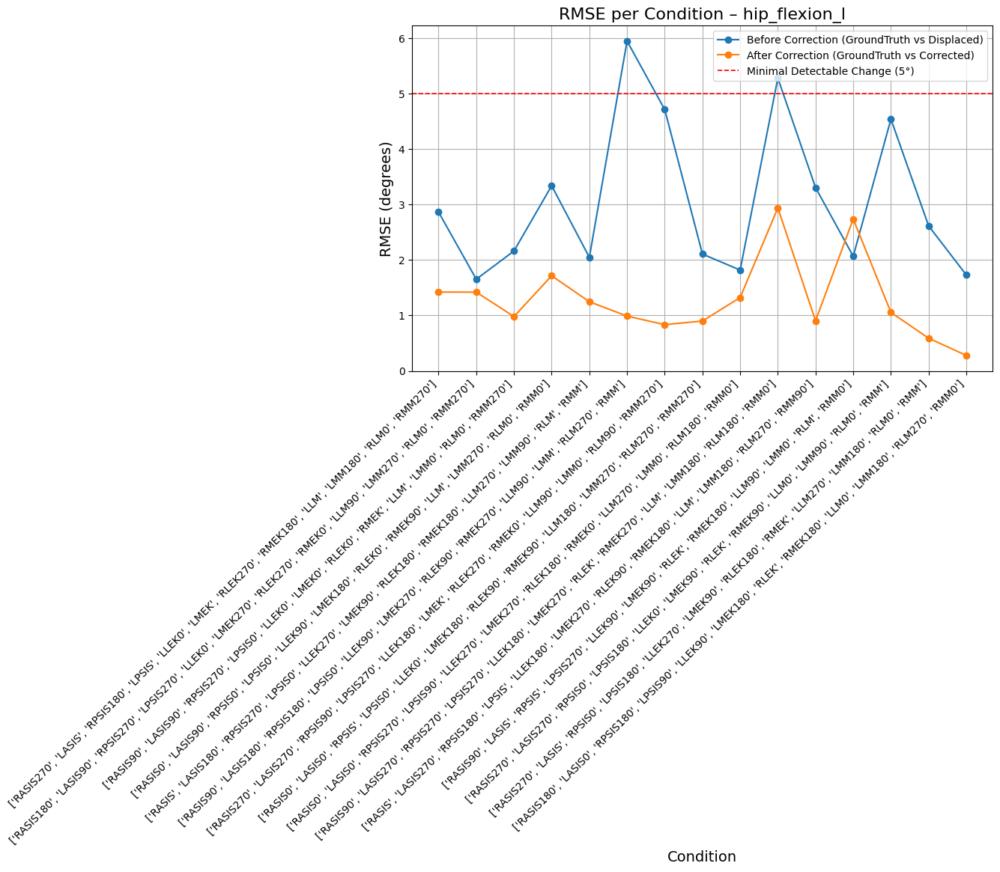


🟢 hip_adduction_l
  Mean BEFORE : 1.7874
  Mean AFTER  : 0.8085
  t-test    : t = 2.950, p = 0.0105 → Significant
  Wilcoxon  : W = 12.000, p = 0.0043 → Significant


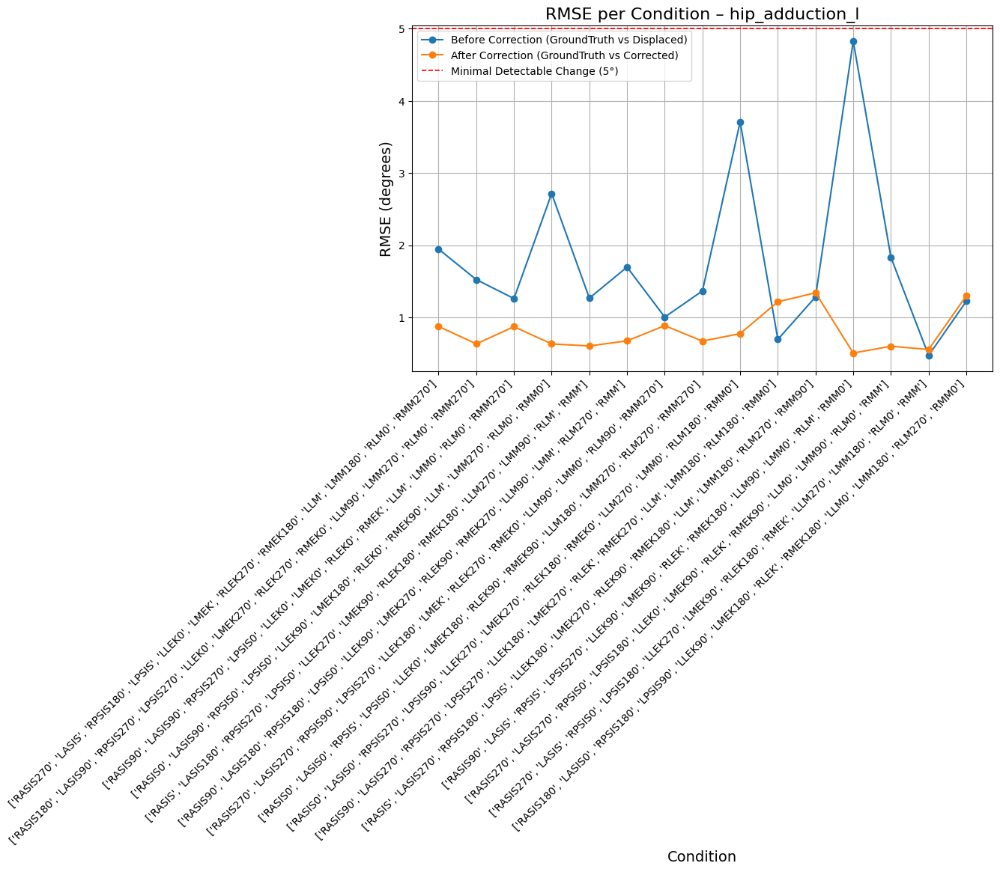


🟢 hip_rotation_l
  Mean BEFORE : 2.0345
  Mean AFTER  : 1.8577
  t-test    : t = 1.677, p = 0.1158 → Not significant
  Wilcoxon  : W = 33.000, p = 0.1354 → Not significant


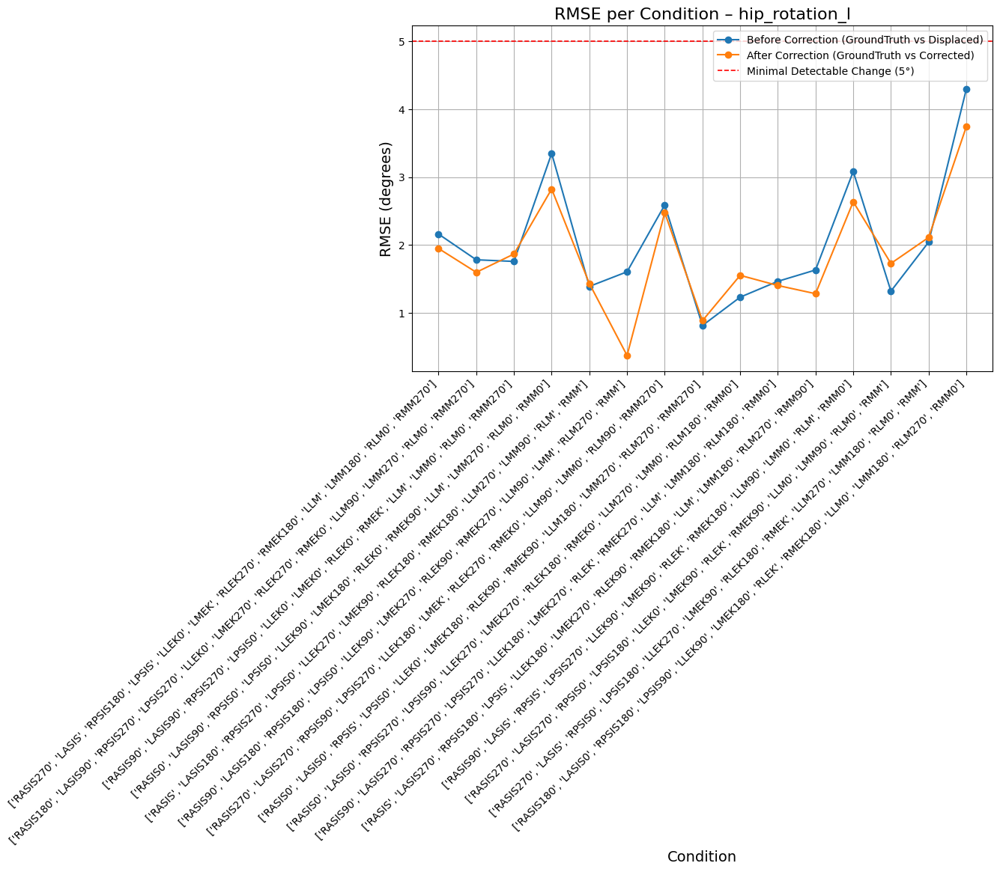


🟢 knee_angle_l
  Mean BEFORE : 1.1309
  Mean AFTER  : 0.8155
  t-test    : t = 2.618, p = 0.0203 → Significant
  Wilcoxon  : W = 21.000, p = 0.0256 → Significant


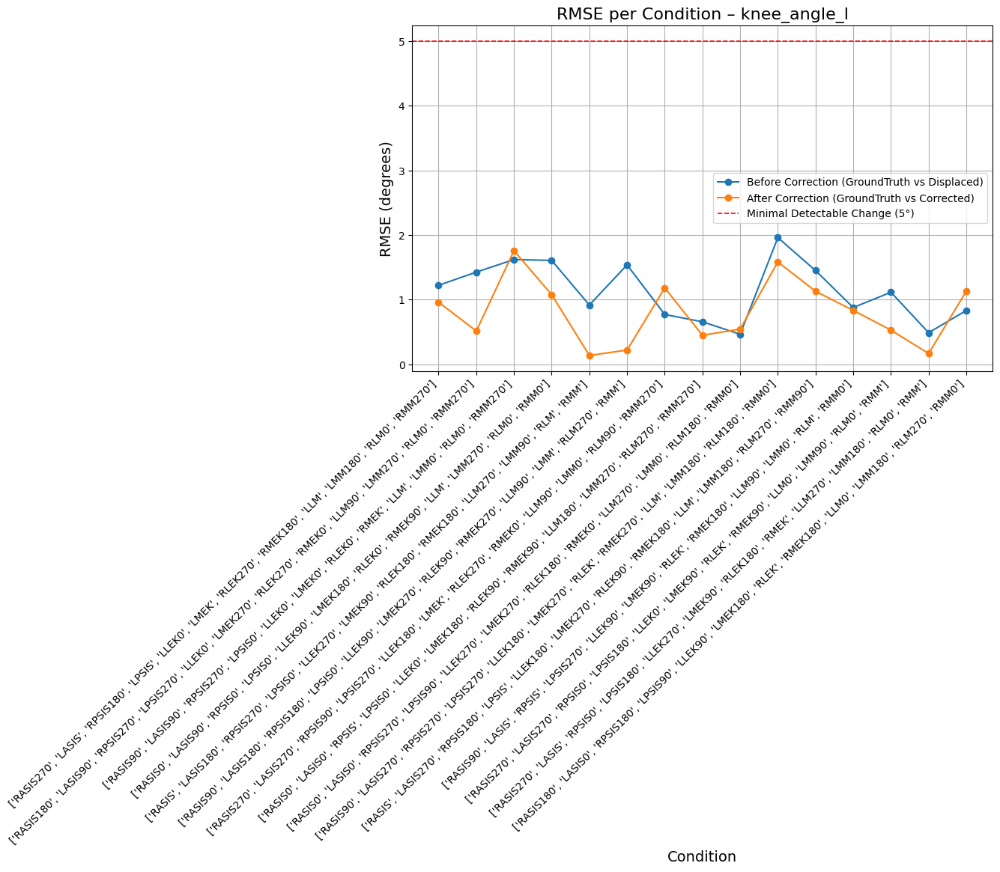


🟢 ankle_angle_l
  Mean BEFORE : 0.6496
  Mean AFTER  : 0.6057
  t-test    : t = 0.985, p = 0.3414 → Not significant
  Wilcoxon  : W = 40.000, p = 0.2769 → Not significant


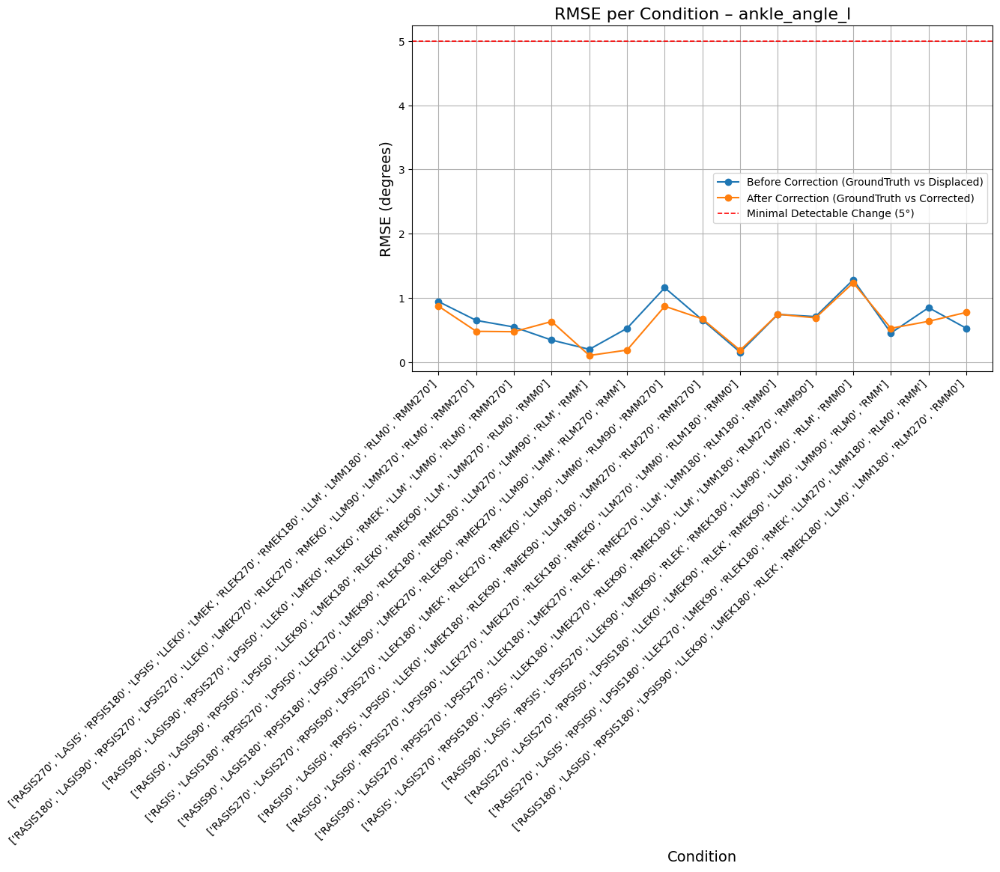


🟢 subtalar_angle_l
  Mean BEFORE : 1.5994
  Mean AFTER  : 1.4426
  t-test    : t = 2.420, p = 0.0297 → Significant
  Wilcoxon  : W = 24.000, p = 0.0413 → Significant


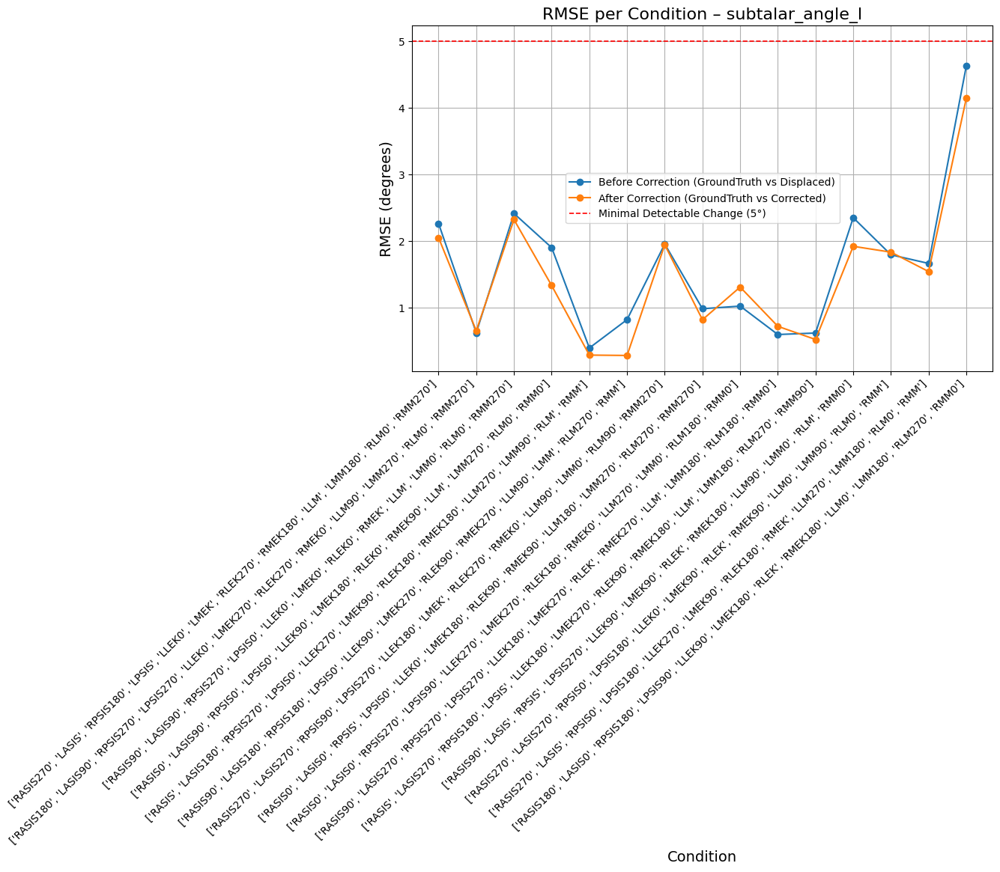


=== Summary Bar Chart: Mean RMSE Before vs After per Kinematic ===


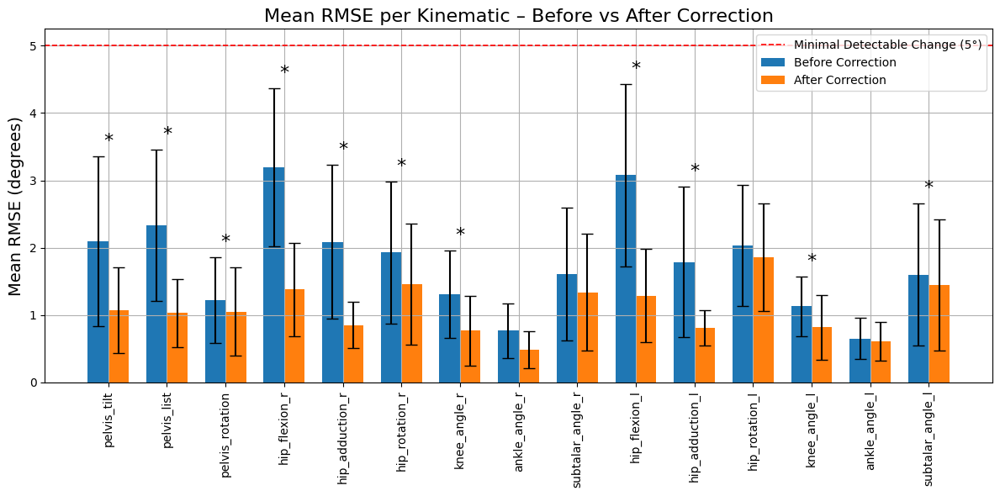

In [8]:
per_kin_b, per_kin_a, global_b, global_a = analyze_correction_effect_per_day_kinematics_(
    ground_truth_path=path_to_gt_pointkin_pointkin_walking_motion,
    files_before=displaced_pointkin_walk_motions,
    files_after=averaged_pointkin_walk_motions,
    kinematics_to_compare=KINEMATICS,
    combo_list=COMBOS
)